In [1]:
# ALL THE IMPORTS NECESSARY
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import matplotlib.pyplot as plt

import pandas as pd
import numpy as np
from numpy.testing import rundocs

from geopy.distance import great_circle as vc
import math as Math

# from mpl_toolkits.basemap import Basemap
# import matplotlib.cm as cm

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from keras.models import Sequential
from keras.layers.core import Dense, Dropout, Activation
from keras.layers import LSTM
from keras.activations import *
import math, time

from keras.models import model_from_json
print("ok")

ok


In [2]:
data = pd.read_csv('atlantic-data.csv', index_col=None, names=['Year', 'Month', 'Day', 'Hour', 'HurricaneNum', 'Name', 'Lat', 'Long', 'WindSpeed', 'Pressure', 'NullCol'])

# Create a unique key for all of the hurricane
data['unique-key'] = data['Name'] + '-' + data['Year'].map(str) + '-' + data['HurricaneNum'].map(str)

# Delete the columns of information that we are not using so far
data.drop(['Name', 'HurricaneNum', 'Year', 'NullCol'], axis = 1, inplace = True)

# Preview the first 5 rows of data
data.head()

,Month,Day,Hour,Lat,Long,WindSpeed,Pressure,unique-key
0,6,7,18,21,-93.0,25.0,0,NOTNAMED-2000-1
1,6,8,0,20.9,-92.8,25.0,0,NOTNAMED-2000-1
2,6,8,6,20.7,-93.1,25.0,0,NOTNAMED-2000-1
3,6,8,12,20.8,-93.5,25.0,0,NOTNAMED-2000-1
4,6,23,0,9.5,-19.8,25.0,0,NOTNAMED-2000-2


In [3]:
# Remove hurricanes where pressure = 0
data = data[data['Pressure'] != 0]
data.head()

,Month,Day,Hour,Lat,Long,WindSpeed,Pressure,unique-key
16,8,3,18,10.8,-18.0,25.0,1007,ALBERTO-2000-3
17,8,4,0,11.5,-20.1,30.0,1005,ALBERTO-2000-3
18,8,4,6,12,-22.3,35.0,1004,ALBERTO-2000-3
19,8,4,12,12.3,-23.8,35.0,1003,ALBERTO-2000-3
20,8,4,18,12.7,-25.2,40.0,1002,ALBERTO-2000-3


In [4]:
# Total amount of hurricanes we have in our dataset 
total_hurricane_count = len(pd.unique(data['unique-key']))
print(total_hurricane_count)

789


In [5]:
# Finding errors in CSV
print(data[data['Lat'].str.contains("NAMED")])

data = data[~data['Lat'].str.contains("NAMED")]

      Month  Day  Hour    Lat  Long  WindSpeed  Pressure   unique-key
5997      8   31    12  NAMED  37.1      -64.3        25  NOT-2011-20
5998      8   31    18  NAMED  37.1      -64.1        25  NOT-2011-20
5999      9    1     0  NAMED  37.3      -63.9        25  NOT-2011-20
6000      9    1     6  NAMED  37.4      -63.7        30  NOT-2011-20
6001      9    1    12  NAMED  37.4      -63.7        40  NOT-2011-20
6002      9    1    18  NAMED  37.4      -63.8        35  NOT-2011-20
6003      9    2     0  NAMED  37.5      -63.8        35  NOT-2011-20
6004      9    2     6  NAMED  37.8      -63.7        40  NOT-2011-20
6005      9    2    12  NAMED  38.0      -62.8        40  NOT-2011-20
6006      9    2    18  NAMED  39.0      -61.8        35  NOT-2011-20
6007      9    3     0  NAMED  40.0      -60.7        30  NOT-2011-20
6008      9    3     6  NAMED  41.0      -59.9        30  NOT-2011-20
6009      9    3    12  NAMED  42.0      -59.2        30  NOT-2011-20
6010      9    3    

In [6]:
# Total amount of hurricanes we have in our dataset 
total_hurricane_count = len(pd.unique(data['unique-key']))
print(total_hurricane_count)

788


In [7]:
# Since our keys are strings, we enumerate them to access them as integers 
keys = list(enumerate(pd.unique(data['unique-key'])))

total_hurricane_count = len(pd.unique(data['unique-key']))
print(total_hurricane_count)

y = np.zeros((total_hurricane_count))
for x in range(0,total_hurricane_count):
    y[x] = len(pd.DataFrame(data[data['unique-key'] == keys[x][1]], columns = data.keys()).reset_index(drop = True))
    
# Now contains how many time instances of data (or rows) each hurricane contains 
hurricane_amount = pd.DataFrame(y)

788


In [8]:
# Print the hurricane key with the amount of data they contain
print ('Top 6 Hurricanes (in terms of data quantity)')
for x in hurricane_amount.nlargest(6, 0).index:
    print (keys[x][1], "-", hurricane_amount.loc[x][0])
    

Top 6 Hurricanes (in terms of data quantity)
NADINE-2012-14 - 96.0
IVAN-2004-9 - 94.0
KYLE-2002-12 - 90.0
ALBERTO-2000-3 - 87.0
ARLENE-1987-2 - 81.0
NICHOLAS-2003-19 - 80.0


In [9]:
cond = (hurricane_amount > 6) & (hurricane_amount < 60)
keys25 = []

for x in cond.index:
    if cond.loc[x][0]:
        keys25.append(keys[x][1])

word2keys = {}
for x in keys:
    word2keys[x[1]] = x[0]
    
data = data[data['unique-key'].isin(keys25)]
keys = list(enumerate(pd.unique(data['unique-key'])))
data.head()

,Month,Day,Hour,Lat,Long,WindSpeed,Pressure,unique-key
116,8,13,18,22.5,-93.5,30.0,1008,BERYL-2000-5
117,8,14,0,22.7,-93.8,30.0,1008,BERYL-2000-5
118,8,14,6,23.1,-94.6,35.0,1007,BERYL-2000-5
119,8,14,12,23.5,-95.4,40.0,1009,BERYL-2000-5
120,8,14,18,23.9,-96.3,45.0,1009,BERYL-2000-5


In [10]:
# Print the hurricane key with the amount of data they contain
print ('Top 6 Hurricanes (in terms of data quantity)')
for x in hurricane_amount.nlargest(6, 0).index:
    print (keys[x][1], "-", hurricane_amount.loc[x][0])

Top 6 Hurricanes (in terms of data quantity)
FABIAN-1991-9 - 96.0
EMILY-2005-5 - 94.0
DANNY-2003-5 - 90.0
BERYL-2000-5 - 87.0
IRENE-1971-18 - 81.0
HERMINE-2004-8 - 80.0


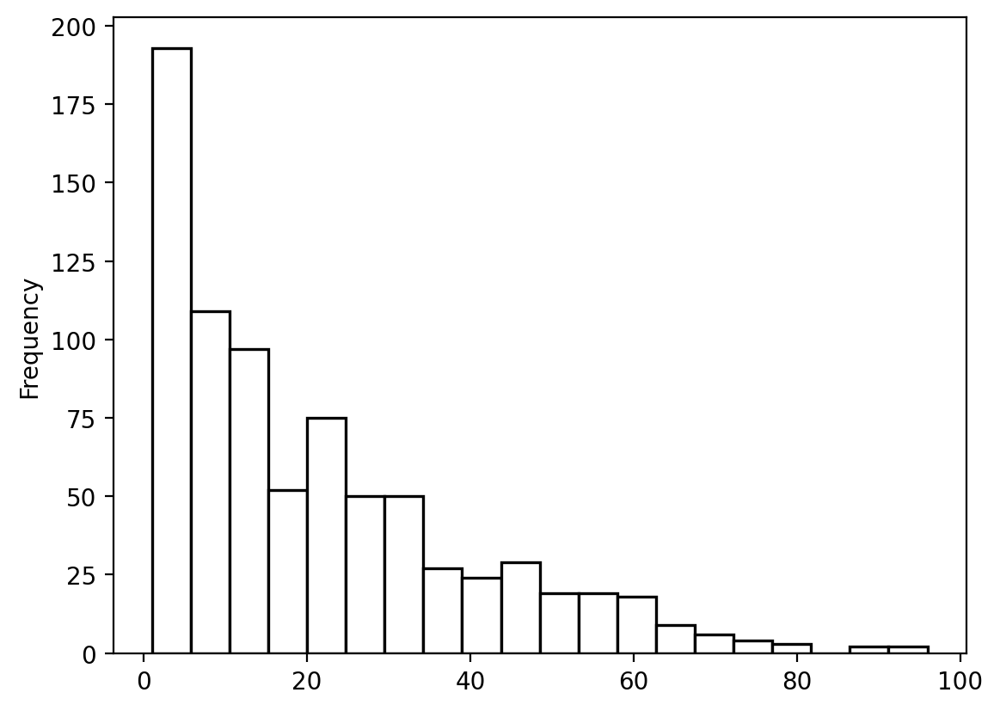

In [11]:
# Print the distribution of data quantity for all hurricanes
dist = hurricane_amount.plot.hist(bins=20, edgecolor='black', histtype='barstacked', color='white', legend=None, linewidth=1.2)
plt.show()

In [12]:
# Since our keys are strings, we enumerate them to access them as integers 
keys = list(enumerate(pd.unique(data['unique-key'])))

total_hurricane_count = len(pd.unique(data['unique-key']))
print(total_hurricane_count)

y = np.zeros((total_hurricane_count))
for x in range(0,total_hurricane_count):
    y[x] = len(pd.DataFrame(data[data['unique-key'] == keys[x][1]], columns = data.keys()).reset_index(drop = True))
    
# Now contains how many time instances of data (or rows) each hurricane contains 
hurricane_amount = pd.DataFrame(y)

539


In [13]:
# Total amount of data tuples
total_data_count = len(data)
print(total_data_count)

13131


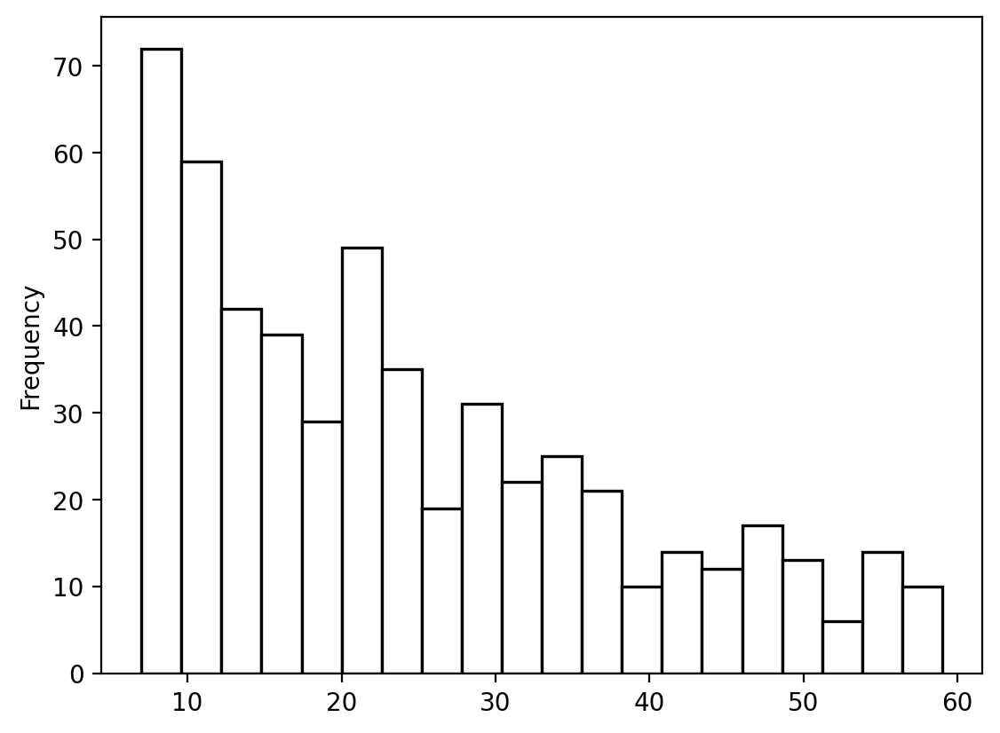

In [14]:
# Print the distribution of data quantity for all hurricanes
dist = hurricane_amount.plot.hist(bins=20, edgecolor='black', histtype='barstacked', color='white', legend=None, linewidth=1.2)
# plt.savefig('frequency_graph', dpi=600)
plt.show()

In [15]:
data.to_csv('checkpoint-dataframe.csv') # Save the dataframe to csv for checkpoint

### Data Preprocessing

From the dataset, we have latitude and longitude. It is easier for the neural network to learn from distance vectors since these values do not contain negative values (like latitude and longitude). To preprocess our data, we will calculate the angle of travel and distance between each given point and add that as new columns to our DataFrame. In addition, we will remove the outlier hurricanes, to get a more normal distribution to insert into the neural network.

In [16]:
data = pd.read_csv('checkpoint-dataframe.csv', index_col=0, header=0)

In [17]:
y = np.zeros(total_hurricane_count)
data['distance'] = np.zeros(total_data_count)
data['direction'] = np.zeros(total_data_count)

# For all hurricanes
for x in range(0, total_hurricane_count):
    t = pd.DataFrame(data[data['unique-key'] == keys[x][1]], columns = data.keys()).reset_index(drop = False)
    dst = 0
    prev = (0,0)
    
    # For all latitude and longitude points of hurricane, calculate the angle of travel and distance
    for p in zip(t['Lat'], t['Long']):
        if prev == (0,0):
            prev = p
            continue 
        # Stores the distance into the DataFrame
        data.at[t[(t['Lat'] == p[0]) & (t['Long'] == p[1])]['index'].values[0], 'distance'] = vc(prev,p).miles
        
        dLon = p[1] - prev[1];  
        temp = float(p[0]) # p[0] is a str?
        y_x = Math.sin(dLon) * Math.cos(temp);
        
        x_x = Math.cos(p[1]) * Math.sin(temp) - Math.sin(p[1]) * Math.cos(temp) * Math.cos(dLon);
        brng = Math.degrees(Math.atan2(y_x, x_x)) 
        if (brng < 0):
            brng+= 360;
        
        # Stores the angle of travel into the DataFrame
        data.at[t[(t['Lat'] == p[0]) & (t['Long'] == p[1])]['index'].values[0], 'direction'] =brng
        dst += vc(prev,p).miles
        prev = p
    y[x] = dst

# Now contains the distance between all given latitude and longitude points
hurricane_distance = pd.DataFrame(y)
print("ok")

ok


In [18]:
# Columns have been added
data.head()

,Month,Day,Hour,Lat,Long,WindSpeed,Pressure,unique-key,distance,direction
116,8,13,18,22.5,-93.5,30.0,1008,BERYL-2000-5,0.000000,0.000000
117,8,14,0,22.7,-93.8,30.0,1008,BERYL-2000-5,23.604117,140.567975
118,8,14,6,23.1,-94.6,35.0,1007,BERYL-2000-5,57.935076,161.351184
119,8,14,12,23.5,-95.4,40.0,1009,BERYL-2000-5,57.802056,174.302218
120,8,14,18,23.9,-96.3,45.0,1009,BERYL-2000-5,63.292296,337.250833


In [19]:
print(hurricane_distance.shape)

(539, 1)


In [20]:
# Print the hurricane key with the amount of data they contain
print ('Top 6 Hurricanes (in terms of distance traveled)')
for x in hurricane_distance.nlargest(6, 0).index:
    print (keys[x][1], "-", hurricane_distance.loc[x][0], "miles -", hurricane_amount.loc[x][0])
    
# print(len(hurricane_distance[0]))
# print(len(hurricane_amount[0]))

Top 6 Hurricanes (in terms of distance traveled)
KATE-2003-16 - 6392.865052499503 miles - 58.0
BERTHA-1996-2 - 6391.785231995273 miles - 51.0
RAFAEL-2012-17 - 6351.748249370005 miles - 56.0
BILL-2009-3 - 6236.426920398357 miles - 46.0
EARL-2010-7 - 6197.276884790264 miles - 55.0
ISAAC-2000-13 - 6156.937260531036 miles - 52.0


[[1.        0.7385791]
 [0.7385791 1.       ]]


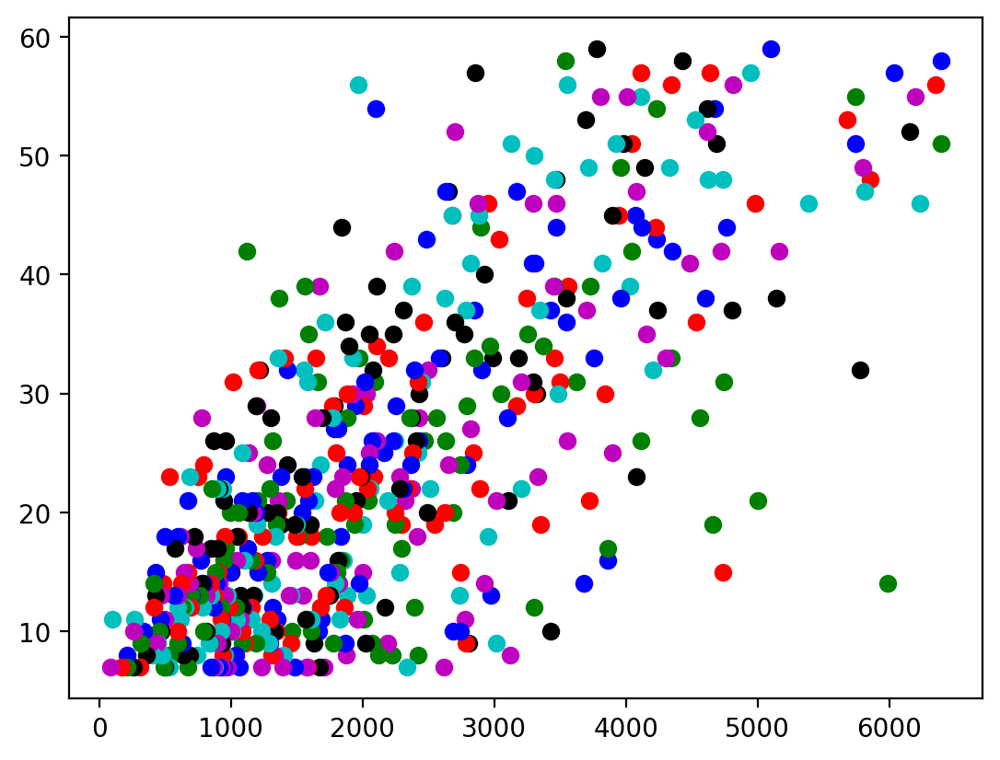

In [21]:
from itertools import cycle
cycol = cycle('bgrcmk')
print( np.corrcoef(hurricane_distance[0], hurricane_amount[0]) )
# Plotted the amount of hurricane distance traveled vs the amount of data they contain.
for x in hurricane_distance.nlargest(len(hurricane_amount[0]), 0).index:
    corr = plt.scatter(hurricane_distance.loc[x][0], hurricane_amount.loc[x][0], color=next(cycol))
# plt.savefig('points_vs_distance', dpi=600)
plt.show()

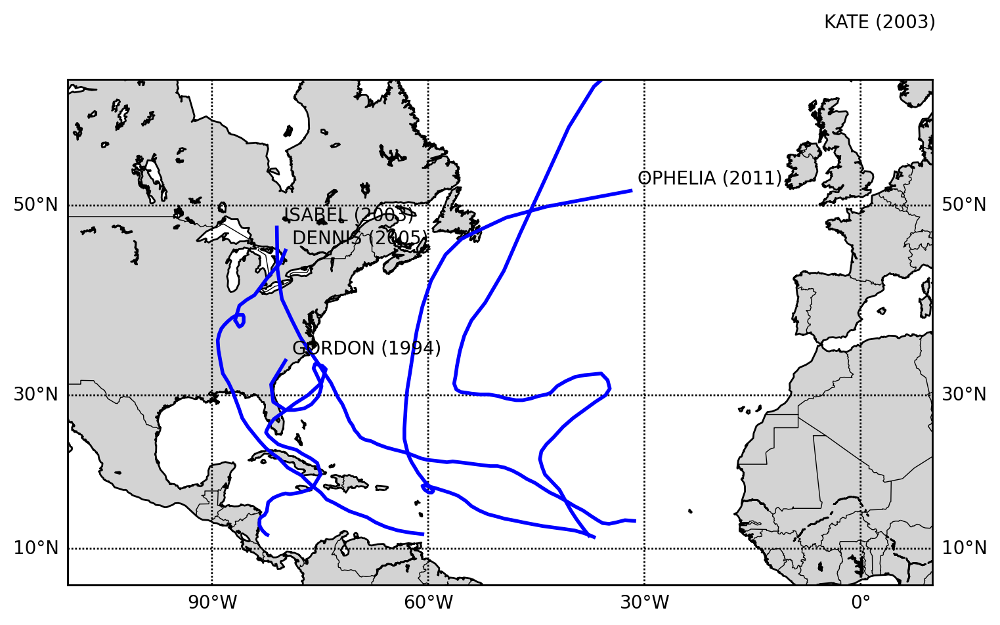

In [22]:
from mpl_toolkits.basemap import Basemap
n = 5 # Number of hurricanes

# Graph the trajectories of the longest hurricanes (the ones that traveled the most)
plt.figure(figsize=(10,5))
m = Basemap(llcrnrlon=-110.,llcrnrlat=5.,urcrnrlon=10.,urcrnrlat=60.,
            rsphere=(6378137.00,6356752.3142),
            resolution='l',
            projection='merc',
            lat_0=40.,lon_0=-20.,lat_ts=20.)
m.drawcoastlines()
m.drawcountries()
m.drawmapboundary(fill_color='white')
m.fillcontinents(color='#D3D3D3')
m.drawparallels(np.arange(10,90,20),labels=[1,1,0,1])
m.drawmeridians(np.arange(-180,180,30),labels=[1,1,0,1])

for x in hurricane_amount.nlargest(n,0).index:
    largest_hurr = data[data['unique-key'] == keys[x][1]]
    lat = largest_hurr['Lat'].values
    long = largest_hurr['Long'].values
    xpt, ypt = m(long, lat)
    plt.text(xpt[len(lat) - 1]+100000,ypt[len(long) - 1]+100000, '%s (%s)' % (keys[x][1].split('-')[0],keys[x][1].split('-')[1]))
    m.plot(xpt, ypt, linewidth=2, color='blue')
    
# plt.title('Top 5 Atlantic Hurricanes (Distance Traveled)')
# plt.savefig('largest_dist_hurricanes')
plt.show()

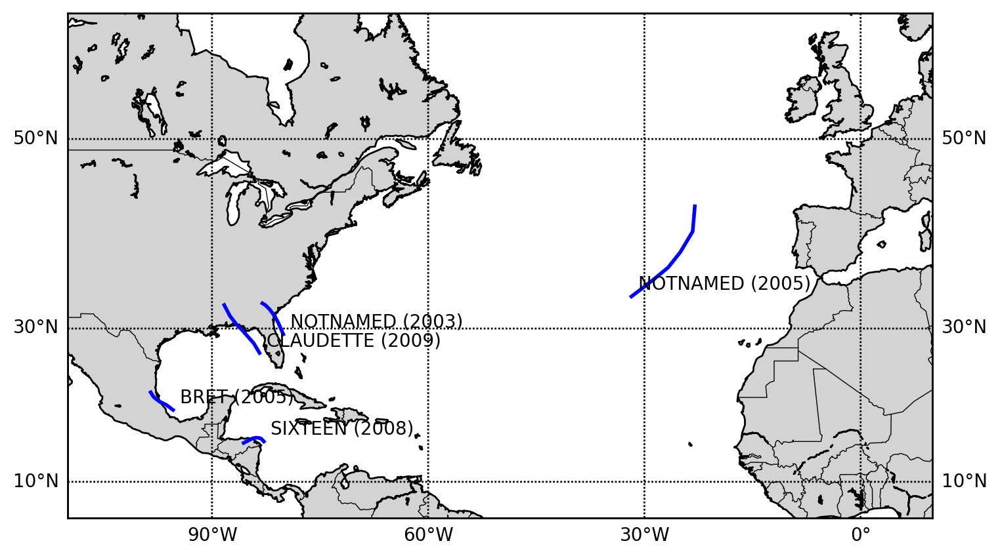

In [23]:
# Graph the trajectories of the shortest hurricanes (the ones that traveled the least)
plt.figure(figsize=(10,5))
m = Basemap(llcrnrlon=-110.,llcrnrlat=5.,urcrnrlon=10.,urcrnrlat=60.,
            rsphere=(6378137.00,6356752.3142),
            resolution='l',
            projection='merc',
            lat_0=40.,lon_0=-20.,lat_ts=20.)
m.drawcoastlines()
m.drawcountries()
m.drawmapboundary(fill_color='white')
m.fillcontinents(color='#D3D3D3')
m.drawparallels(np.arange(10,90,20),labels=[1,1,0,1])
m.drawmeridians(np.arange(-180,180,30),labels=[1,1,0,1])

for x in hurricane_amount.nsmallest(n,0).index:
    largest_hurr = data[data['unique-key'] == keys[x][1]]
    lat = largest_hurr['Lat'].values
    long = largest_hurr['Long'].values
    xpt, ypt = m(long, lat)
    plt.text(xpt[0]+100000,ypt[0]+100000, '%s (%s)' % (keys[x][1].split('-')[0],keys[x][1].split('-')[1]))
    m.plot(xpt, ypt, linewidth=2, color='blue')
    
# plt.title('Smallest 5 Atlantic Hurricanes (Distance Traveled)')
# plt.savefig('smallest_dist_hurricanes')
plt.show()

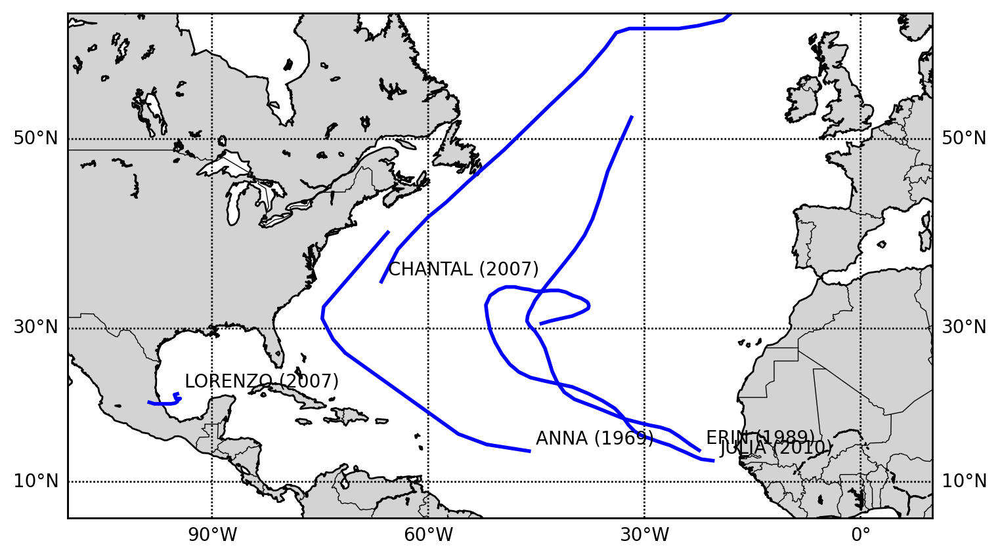

In [24]:
# Graph the trajectories of 3 random hurricanes 
plt.figure(figsize=(10,5))
m = Basemap(llcrnrlon=-110.,llcrnrlat=5.,urcrnrlon=10.,urcrnrlat=60.,
            rsphere=(6378137.00,6356752.3142),
            resolution='l',
            projection='merc',
            lat_0=40.,lon_0=-20.,lat_ts=20.)
m.drawcoastlines()
m.drawcountries()
m.drawmapboundary(fill_color='white')
m.fillcontinents(color='#D3D3D3')
m.drawparallels(np.arange(10,90,20),labels=[1,1,0,1])
m.drawmeridians(np.arange(-180,180,30),labels=[1,1,0,1])

for x in np.random.choice(total_hurricane_count, n):
    largest_hurr = data[data['unique-key'] == keys[x][1]]
    lat = largest_hurr['Lat'].values
    long = largest_hurr['Long'].values
    xpt, ypt = m(long, lat)
    plt.text(xpt[0]+100000,ypt[0]+100000, '%s (%s)' % (keys[x][1].split('-')[0],keys[x][1].split('-')[1]))
    m.plot(xpt, ypt, linewidth=2, color='blue')
    
# plt.title('Random 5 Atlantic Hurricanes')
# plt.savefig('random_dist_hurricanes')
plt.show()

In [25]:
data.head()

,Month,Day,Hour,Lat,Long,WindSpeed,Pressure,unique-key,distance,direction
116,8,13,18,22.5,-93.5,30.0,1008,BERYL-2000-5,0.000000,0.000000
117,8,14,0,22.7,-93.8,30.0,1008,BERYL-2000-5,23.604117,140.567975
118,8,14,6,23.1,-94.6,35.0,1007,BERYL-2000-5,57.935076,161.351184
119,8,14,12,23.5,-95.4,40.0,1009,BERYL-2000-5,57.802056,174.302218
120,8,14,18,23.9,-96.3,45.0,1009,BERYL-2000-5,63.292296,337.250833


In [26]:
import scipy

dist = data[data['distance'] > 0]['distance']
scipy.stats.anderson(dist, dist='norm')

AndersonResult(statistic=814.2159961835368, critical_values=array([0.576, 0.656, 0.787, 0.918, 1.092]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))

<AxesSubplot:ylabel='Density'>

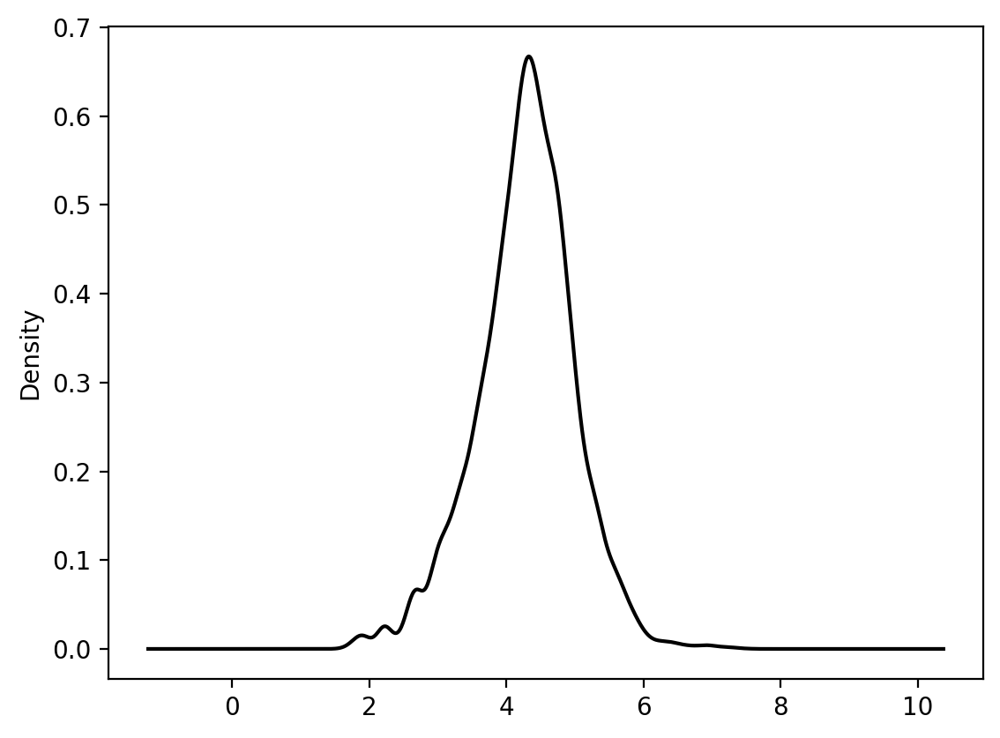

In [27]:
# Distribution of distance traveled in a 6 hour time interval for all hurricanes
dist_log = np.log(dist)
ser = pd.Series(dist_log)
ser.plot(kind='kde', cmap='gray')
# plt.savefig('distance_dist')

In [28]:
scipy.stats.anderson(dist_log, dist='norm')

AndersonResult(statistic=39.930066824075766, critical_values=array([0.576, 0.656, 0.787, 0.918, 1.092]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))

In [29]:
import sklearn 

dist_norm = normalized = (dist-min(dist))/(max(dist)-min(dist))
scipy.stats.anderson(dist_norm, dist='norm')

AndersonResult(statistic=814.2159961835387, critical_values=array([0.576, 0.656, 0.787, 0.918, 1.092]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))

<AxesSubplot:ylabel='Density'>

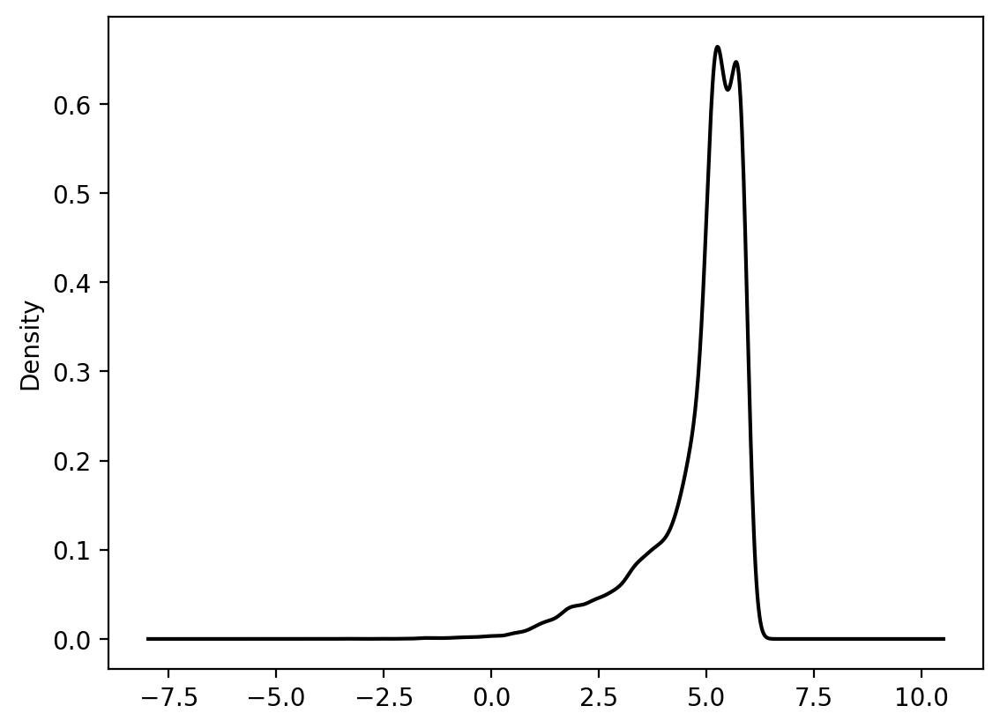

In [30]:
# Distribution of angle traveled in a 6 hour time interval for all hurricanes
direc = data[data['direction'] > 0]
direc = np.log(direc['direction'])
ser = pd.Series(direc)
ser.plot(kind='kde', cmap='gray')
# plt.savefig('distance_dist')

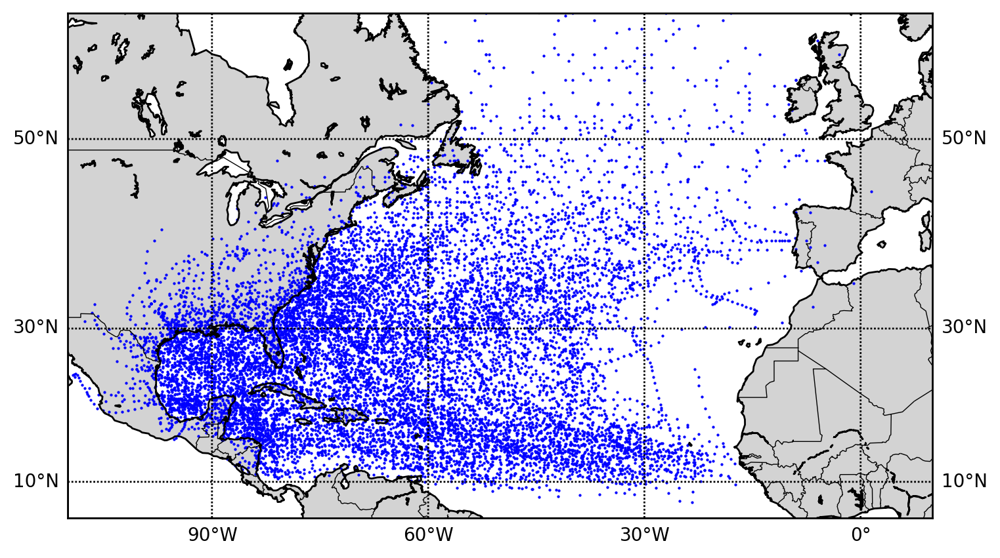

In [31]:
# Graph all points 
plt.figure(figsize=(10,5))
m = Basemap(llcrnrlon=-110.,llcrnrlat=5.,urcrnrlon=10.,urcrnrlat=60.,
            rsphere=(6378137.00,6356752.3142),
            resolution='l',
            projection='merc',
            lat_0=40.,lon_0=-20.,lat_ts=20.)
m.drawcoastlines()
m.drawcountries()
m.drawmapboundary(fill_color='white')
m.fillcontinents(color='#D3D3D3')
m.drawparallels(np.arange(10,90,20),labels=[1,1,0,1])
m.drawmeridians(np.arange(-180,180,30),labels=[1,1,0,1])

lat = data['Lat'].values
long = data['Long'].values
xpt, ypt = m(long, lat)
m.scatter(xpt, ypt, .3, color='blue')

# plt.savefig('scatter_hurricanes')
plt.show()

In [32]:
print(len(xpt))

13131


In [33]:
# Assigning each point to a specific location in the grid. 
# For example, we will learn how a hurricane in quadrant 2 with move.
data['gridID'] = np.zeros(total_data_count)

In [34]:
# These variable are hyperparameters
lat_min = 7.2
long_min = -109.3
lat_interval = round(66 - 7.2)
long_interval = round(13.5 + 109.3)

data['gridID'] = np.floor(data['Lat'] - 7.200)* long_interval  + np.floor(data['Long'] + 109.3)
data['gridID'] = round(data['gridID'])

In [35]:
data.to_csv('checkpoint-dataframe.csv') # Save the dataframe to csv for checkpoint

### Build the Model

In [36]:
data = pd.read_csv('checkpoint-dataframe.csv', index_col=0) 

In [37]:
data.head() # Check loaded data

,Month,Day,Hour,Lat,Long,WindSpeed,Pressure,unique-key,distance,direction,gridID
116,8,13,18,22.5,-93.5,30.0,1008,BERYL-2000-5,0.000000,0.000000,1860.0
117,8,14,0,22.7,-93.8,30.0,1008,BERYL-2000-5,23.604117,140.567975,1860.0
118,8,14,6,23.1,-94.6,35.0,1007,BERYL-2000-5,57.935076,161.351184,1859.0
119,8,14,12,23.5,-95.4,40.0,1009,BERYL-2000-5,57.802056,174.302218,1981.0
120,8,14,18,23.9,-96.3,45.0,1009,BERYL-2000-5,63.292296,337.250833,1981.0


In [38]:
names = data['unique-key'].unique()
data.drop(['Month', 'Day', 'Hour', 'Lat', 'Long'], axis = 1, inplace = True)
data.head()

,WindSpeed,Pressure,unique-key,distance,direction,gridID
116,30.0,1008,BERYL-2000-5,0.000000,0.000000,1860.0
117,30.0,1008,BERYL-2000-5,23.604117,140.567975,1860.0
118,35.0,1007,BERYL-2000-5,57.935076,161.351184,1859.0
119,40.0,1009,BERYL-2000-5,57.802056,174.302218,1981.0
120,45.0,1009,BERYL-2000-5,63.292296,337.250833,1981.0


In [39]:
np.array(data)

array([[30.0, 1008, 'BERYL-2000-5', 0.0, 0.0, 1860.0],
       [30.0, 1008, 'BERYL-2000-5', 23.60411650844807,
        140.56797538055898, 1860.0],
       [35.0, 1007, 'BERYL-2000-5', 57.93507557987407,
        161.35118414564937, 1859.0],
       ...,
       [70.0, 975, 'NOTNAMED-1929-2', 479.9202138698258,
        32.902723473217954, 2852.0],
       [60.0, 975, 'NOTNAMED-1929-2', 22.61060368758486,
        19.576091043963004, 2852.0],
       [55.0, 986, 'NOTNAMED-1929-2', 82.46837457733908,
        58.54528785490512, 2854.0]], dtype=object)

In [40]:
np.unique(data['unique-key'])

array(['ABBY-1968-1', 'AGNES-1972-2', 'ALBERTO-1982-1', 'ALBERTO-1988-1',
       'ALBERTO-1994-1', 'ALBERTO-2006-1', 'ALBERTO-2012-1',
       'ALEX-1998-1', 'ALEX-2004-1', 'ALEX-2010-1', 'ALICE-1973-4',
       'ALICIA-1983-3', 'ALLEN-1980-4', 'ALLISON-1989-2',
       'ALLISON-1995-1', 'ALLISON-2001-1', 'ALMA-1962-1', 'ALMA-1966-1',
       'ALMA-1970-1', 'ALPHA-1972-1', 'ALPHA-2005-26', 'AMY-1975-2',
       'ANA-1979-2', 'ANA-1985-1', 'ANA-1991-1', 'ANA-1997-2',
       'ANA-2003-1', 'ANA-2009-2', 'ANDREA-2007-1', 'ANDREW-1986-1',
       'ANDREW-1992-4', 'ANITA-1977-5', 'ANNA-1961-1', 'ANNA-1969-6',
       'ANNA-1976-6', 'ARLENE-1963-1', 'ARLENE-1967-11', 'ARLENE-1981-3',
       'ARLENE-1993-2', 'ARLENE-1999-1', 'ARLENE-2005-1', 'ARLENE-2011-1',
       'ARTHUR-1984-6', 'ARTHUR-1990-2', 'ARTHUR-1996-1', 'ARTHUR-2002-1',
       'ARTHUR-2008-1', 'BABE-1977-6', 'BARRY-1983-4', 'BARRY-1989-3',
       'BARRY-1995-2', 'BARRY-2001-3', 'BARRY-2007-2', 'BECKY-1970-2',
       'BELLE-1976-7', 'BERTH

In [41]:
data_pad = []
for key in np.unique(data['unique-key']):
    data_pad += [data[ data.loc[:, 'unique-key'] == key].loc[:, ['WindSpeed', 'Pressure', 'distance', 'direction', 'gridID']]]

In [42]:
data_pad[0:3]

[       WindSpeed  Pressure    distance   direction  gridID
 21217       30.0      1005    0.000000    0.000000  1376.0
 21220       40.0      1002  190.999054  230.915394  1746.0
 21221       45.0       997   73.125660  248.497817  1870.0
 21222       60.0       999   71.686942  348.773839  1993.0
 21223       65.0       999   85.050130   14.434896  2116.0
 21225       65.0       994   45.526444   17.180714  2117.0
 21226       60.0       993   54.424009   18.917150  2240.0
 21227       55.0       992   90.717511  350.544696  2364.0
 21230       50.0       994  110.827466  292.193468  2488.0
 21232       50.0       965   47.486532  321.421596  2489.0
 21233       50.0       997   18.441810  348.103154  2489.0
 21237       50.0       999  201.090838  223.305339  2856.0,
        WindSpeed  Pressure    distance   direction  gridID
 15374       30.0      1001    0.000000    0.000000  1498.0
 15376       40.0       998   51.941213  147.232643  1499.0
 15384       65.0       986  265.356052

In [43]:
len(data)
len(data_pad)
len_vals = []
for x in range(len(data_pad)):
    len_vals += [len(data_pad[x])]
print(max(len_vals))

59


In [44]:
#!pip install torch
import keras
#from torch.nn.utils.rnn import pad_sequence
padded_data = keras.utils.pad_sequences(data_pad, maxlen=60, dtype='int32', padding='post', truncating='pre', value=0.0)

In [45]:
padded_data[7]

array([[  25, 1009,    0,    0,  575],
       [  25, 1009,  124,  290,  574],
       [  25, 1009,  139,  301,  572],
       [  25, 1008,  144,  276,  693],
       [  30, 1007,  136,  241,  691],
       [  30, 1006,  121,  248,  689],
       [  35, 1005,  115,  303,  810],
       [  35, 1005,  115,  310,  808],
       [  35, 1005,  101,  215,  807],
       [  35, 1005,   88,  194,  806],
       [  35, 1005,   89,   16,  804],
       [  40, 1003,   88,   14,  926],
       [  40, 1003,   76,   63,  925],
       [  45, 1003,   78,  130,  924],
       [  45, 1002,   69,  111, 1046],
       [  45, 1003,   67,   65, 1045],
       [  45, 1003,   73,   65, 1044],
       [  40, 1005,   80,   98, 1042],
       [  35, 1007,   86,  106, 1041],
       [  35, 1009,   96,   59, 1163],
       [  40, 1009,   89,   26, 1162],
       [  40, 1012,   91,  213, 1283],
       [  35, 1012,   86,  240, 1405],
       [  35, 1012,   88,  292, 1404],
       [  35, 1012,   85,  251, 1526],
       [  30, 1014,   88,

In [46]:
max(data['gridID']) # Total grid spots

7256.0

In [47]:
# Normalize the values to predict them more easily in our model
scalers = {}
gridScalers = {}
for name in names:
    scalers[name] = MinMaxScaler(feature_range=(0, 1))
#     gridScalers[name] = MinMaxScaler(feature_range=(0, 1))
#     gridScalers[name].fit_transform((data[data['unique-key'] == name])['gridID'].reshape(-1,1))
    hurricane = data[data['unique-key'] == name]
    pd.set_option('mode.chained_assignment', None)
    hurricane.drop('unique-key', axis = 1, inplace= True)
    
    hurricane = pd.DataFrame(scalers[name].fit_transform(hurricane), columns=['WindSpeed',
                                                                              'Pressure',
                                                                              'distance',
                                                                              'direction', 
                                                                              'gridID'])
    data.loc[data['unique-key'] == name, ['WindSpeed', 'Pressure', 'distance', 'direction', 'gridID']] = hurricane.values

In [48]:
data.head()

,WindSpeed,Pressure,unique-key,distance,direction,gridID
116,0.25,0.2,BERYL-2000-5,0.000000,0.000000,0.002747
117,0.25,0.2,BERYL-2000-5,0.302926,0.412575,0.002747
118,0.50,0.0,BERYL-2000-5,0.743516,0.473574,0.000000
119,0.75,0.4,BERYL-2000-5,0.741808,0.511586,0.335165
120,1.00,0.4,BERYL-2000-5,0.812268,0.989849,0.335165


In [49]:
data_pad = []
for key in np.unique(data['unique-key']):
    data_pad += [data[ data.loc[:, 'unique-key'] == key].loc[:, ['WindSpeed', 'Pressure', 'distance', 'direction', 'gridID']]]

In [50]:
data_pad[1]

,WindSpeed,Pressure,distance,direction,gridID
15374,0.000000,1.000000,0.000000,0.000000,0.000000
15376,0.222222,0.875000,0.160248,0.410819,0.000385
15384,0.777778,0.375000,0.818671,0.037548,0.189908
15385,0.777778,0.250000,0.214049,0.531265,0.237288
15386,1.000000,0.208333,0.255799,0.502249,0.284669
15387,1.000000,0.041667,0.255799,0.502249,0.379430
15388,1.000000,0.041667,0.277115,0.000000,0.426810
15389,0.777778,0.250000,0.235221,1.000000,0.474191
15391,0.000000,0.541667,0.417785,0.232419,0.569337
15393,0.000000,0.625000,0.468836,0.031535,0.617488


In [51]:
padded_data = keras.utils.pad_sequences(data_pad, maxlen=60, dtype='float', padding='post', truncating='pre', value=0.0)

In [52]:
padded_data[0]

array([[0.        , 1.        , 0.        , 0.        , 0.        ],
       [0.28571429, 0.925     , 0.9498148 , 0.6587331 , 0.25      ],
       [0.42857143, 0.8       , 0.36364491, 0.70889053, 0.33378378],
       [0.85714286, 0.85      , 0.35649035, 0.99494827, 0.41689189],
       [1.        , 0.85      , 0.42294383, 0.04117848, 0.5       ],
       [1.        , 0.725     , 0.22639741, 0.04901148, 0.50067568],
       [0.85714286, 0.7       , 0.2706439 , 0.05396502, 0.58378378],
       [0.71428571, 0.675     , 0.45112703, 1.        , 0.66756757],
       [0.57142857, 0.725     , 0.55113136, 0.83354126, 0.75135135],
       [0.57142857, 0.        , 0.23614468, 0.91692044, 0.75202703],
       [0.57142857, 0.8       , 0.09170885, 0.993035  , 0.75202703],
       [0.57142857, 0.85      , 1.        , 0.63702387, 1.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.

In [53]:
print(len(padded_data[0]))
print(len(padded_data))

60
539


In [54]:
temp_flat = padded_data.reshape(60*539,5)
print(temp_flat[0:200])
print(temp_flat.shape)

[[0.00000000e+00 1.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00]
 [2.85714286e-01 9.25000000e-01 9.49814800e-01 6.58733098e-01
  2.50000000e-01]
 [4.28571429e-01 8.00000000e-01 3.63644912e-01 7.08890533e-01
  3.33783784e-01]
 [8.57142857e-01 8.50000000e-01 3.56490346e-01 9.94948268e-01
  4.16891892e-01]
 [1.00000000e+00 8.50000000e-01 4.22943834e-01 4.11784754e-02
  5.00000000e-01]
 [1.00000000e+00 7.25000000e-01 2.26397407e-01 4.90114784e-02
  5.00675676e-01]
 [8.57142857e-01 7.00000000e-01 2.70643902e-01 5.39650168e-02
  5.83783784e-01]
 [7.14285714e-01 6.75000000e-01 4.51127025e-01 1.00000000e+00
  6.67567568e-01]
 [5.71428571e-01 7.25000000e-01 5.51131357e-01 8.33541260e-01
  7.51351351e-01]
 [5.71428571e-01 0.00000000e+00 2.36144682e-01 9.16920436e-01
  7.52027027e-01]
 [5.71428571e-01 8.00000000e-01 9.17088519e-02 9.93035004e-01
  7.52027027e-01]
 [5.71428571e-01 8.50000000e-01 1.00000000e+00 6.37023870e-01
  1.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.000000

In [55]:
def load_data(stock, seq_len, amount_of_features):
#     amount_of_features = len(stock.columns)
#     data = stock.as_matrix() 
    sequence_length = seq_len + 1 # Because index starts at 0
    result = []

    for index in range(len(stock) - sequence_length):
        seq = stock[index: index + sequence_length]
        result.append(seq)
    
    result = np.array(result)
    row = len(result) * 0.85 # Amount of data to train on    
    train = result[:int(row), :]
    x_train = train[:, :-1]
    y_train = train[:, -1][:,-1]
    x_test = result[int(row):, :-1]
    y_test = result[int(row):, -1][:,-1]

    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], amount_of_features))
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], amount_of_features))  

    return [x_train, y_train, x_test, y_test]

In [56]:
def build_model(layers):
    model = Sequential()

    for x in range(0,3):
        model.add(LSTM(5,input_dim=layers[0], return_sequences=True))
        model.add(Dropout(0.1))

    model.add(LSTM(layers[2], return_sequences=False)) 
    model.add(Dropout(0.1))

    model.add(Dense(1,input_dim=539))
    model.add(Activation("tanh"))

    start = time.time()
    model.compile(loss="mse", optimizer="rmsprop",metrics=['accuracy'])
    print("Compilation Time : ", time.time() - start)
    return model

### Train the Model

In [57]:
seq_len = 12 # Another hyperparameter- length of hurricane?
feature_count = 5
X_train, y_train, X_test, y_test = load_data(temp_flat[::-1], seq_len, feature_count)
print("X_train", X_train.shape)
print("y_train", y_train.shape)
print("X_test", X_test.shape)
print("y_test", y_test.shape)

X_train (27477, 12, 5)
y_train (27477,)
X_test (4850, 12, 5)
y_test (4850,)


In [58]:
model = build_model([feature_count, seq_len, 1])

Compilation Time :  0.0


In [59]:
model.fit(X_train, y_train, batch_size=512, epochs=200, validation_split=0.1, verbose=1)

Epoch 1/200
49/49 [==============================] - 10s 58ms/step - loss: 0.0989 - accuracy: 0.6043 - val_loss: 0.0837 - val_accuracy: 0.6477
Epoch 2/200
49/49 [==============================] - 1s 24ms/step - loss: 0.0888 - accuracy: 0.6043 - val_loss: 0.0765 - val_accuracy: 0.6477
Epoch 3/200
49/49 [==============================] - 1s 23ms/step - loss: 0.0802 - accuracy: 0.6043 - val_loss: 0.0700 - val_accuracy: 0.6477
Epoch 4/200
49/49 [==============================] - 1s 23ms/step - loss: 0.0733 - accuracy: 0.6043 - val_loss: 0.0624 - val_accuracy: 0.6477
Epoch 5/200
49/49 [==============================] - 1s 23ms/step - loss: 0.0648 - accuracy: 0.6037 - val_loss: 0.0561 - val_accuracy: 0.6481
Epoch 6/200
49/49 [==============================] - 1s 23ms/step - loss: 0.0591 - accuracy: 0.6023 - val_loss: 0.0503 - val_accuracy: 0.6467
Epoch 7/200
49/49 [==============================] - 1s 23ms/step - loss: 0.0551 - accuracy: 0.6019 - val_loss: 0.0457 - val_accuracy: 0.6456
Epoch

49/49 [==============================] - 1s 23ms/step - loss: 0.0269 - accuracy: 0.6097 - val_loss: 0.0200 - val_accuracy: 0.6521
Epoch 59/200
49/49 [==============================] - 1s 23ms/step - loss: 0.0268 - accuracy: 0.6093 - val_loss: 0.0196 - val_accuracy: 0.6521
Epoch 60/200
49/49 [==============================] - 1s 23ms/step - loss: 0.0263 - accuracy: 0.6099 - val_loss: 0.0195 - val_accuracy: 0.6521
Epoch 61/200
49/49 [==============================] - 1s 24ms/step - loss: 0.0268 - accuracy: 0.6100 - val_loss: 0.0194 - val_accuracy: 0.6517
Epoch 62/200
49/49 [==============================] - 1s 25ms/step - loss: 0.0268 - accuracy: 0.6097 - val_loss: 0.0202 - val_accuracy: 0.6514
Epoch 63/200
49/49 [==============================] - 1s 26ms/step - loss: 0.0271 - accuracy: 0.6097 - val_loss: 0.0196 - val_accuracy: 0.6521
Epoch 64/200
49/49 [==============================] - 1s 27ms/step - loss: 0.0270 - accuracy: 0.6098 - val_loss: 0.0195 - val_accuracy: 0.6521
Epoch 65/200

49/49 [==============================] - 1s 27ms/step - loss: 0.0260 - accuracy: 0.6100 - val_loss: 0.0191 - val_accuracy: 0.6521
Epoch 116/200
49/49 [==============================] - 1s 27ms/step - loss: 0.0260 - accuracy: 0.6101 - val_loss: 0.0193 - val_accuracy: 0.6514
Epoch 117/200
49/49 [==============================] - 1s 28ms/step - loss: 0.0258 - accuracy: 0.6101 - val_loss: 0.0195 - val_accuracy: 0.6521
Epoch 118/200
49/49 [==============================] - 1s 28ms/step - loss: 0.0263 - accuracy: 0.6099 - val_loss: 0.0196 - val_accuracy: 0.6521
Epoch 119/200
49/49 [==============================] - 1s 27ms/step - loss: 0.0260 - accuracy: 0.6100 - val_loss: 0.0191 - val_accuracy: 0.6521
Epoch 120/200
49/49 [==============================] - 1s 25ms/step - loss: 0.0259 - accuracy: 0.6100 - val_loss: 0.0196 - val_accuracy: 0.6514
Epoch 121/200
49/49 [==============================] - 1s 26ms/step - loss: 0.0259 - accuracy: 0.6097 - val_loss: 0.0194 - val_accuracy: 0.6521
Epoch 

Epoch 172/200
49/49 [==============================] - 1s 26ms/step - loss: 0.0258 - accuracy: 0.6097 - val_loss: 0.0196 - val_accuracy: 0.6517
Epoch 173/200
49/49 [==============================] - 1s 30ms/step - loss: 0.0258 - accuracy: 0.6101 - val_loss: 0.0195 - val_accuracy: 0.6521
Epoch 174/200
49/49 [==============================] - 1s 26ms/step - loss: 0.0260 - accuracy: 0.6099 - val_loss: 0.0191 - val_accuracy: 0.6521
Epoch 175/200
49/49 [==============================] - 1s 25ms/step - loss: 0.0261 - accuracy: 0.6101 - val_loss: 0.0190 - val_accuracy: 0.6517
Epoch 176/200
49/49 [==============================] - 1s 25ms/step - loss: 0.0253 - accuracy: 0.6101 - val_loss: 0.0195 - val_accuracy: 0.6521
Epoch 177/200
49/49 [==============================] - 1s 25ms/step - loss: 0.0261 - accuracy: 0.6103 - val_loss: 0.0189 - val_accuracy: 0.6517
Epoch 178/200
49/49 [==============================] - 1s 26ms/step - loss: 0.0261 - accuracy: 0.6103 - val_loss: 0.0194 - val_accuracy:

In [60]:
trainScore = model.evaluate(X_train, y_train, verbose=0)
print('Train Score: %.4f MSE (%.4f RMSE)' % (trainScore[0], math.sqrt(trainScore[0])))

testScore = model.evaluate(X_test, y_test, verbose=0)
print('Test Score: %.4f MSE (%.4f RMSE)' % (testScore[0], math.sqrt(testScore[0])))

Train Score: 0.0180 MSE (0.1343 RMSE)
Test Score: 0.0178 MSE (0.1334 RMSE)


In [61]:
#SAVING MODEL

# Serialize model to JSON
model_json = model.to_json()
with open("model_sheils.json", "w") as json_file:
    json_file.write(model_json)

# Serialize weights to HDF5
model.save_weights("model_sheils.h5")
print("Saved Model to Disk")

Saved Model to Disk


### Predicting Hurricane Trajectory

In [62]:
# Load json and create model
json_file = open('model_sheils.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)

# Load weights into new model
loaded_model.load_weights("model_sheils.h5")
print("Loaded Model from Disk")
model = loaded_model

# Evaluate loaded model on test data
#loaded_model.compile(loss='mse', optimizer='rmsprop', metrics=['accuracy'])
#score = loaded_model.evaluate(X, Y, verbose=0)
#print("%s: %.2f%%" % (loaded_model.metrics_names[1], score[1]*100))

Loaded Model from Disk


In [63]:
pred = model.predict(X_test)

152/152 [==============================] - 2s 5ms/step


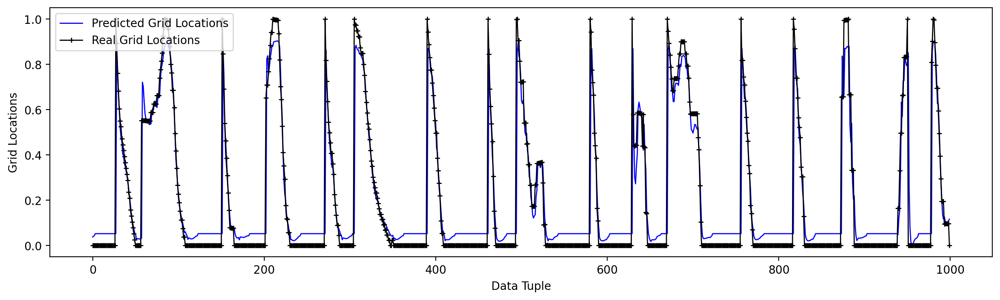

In [64]:
plt.figure(figsize=(15, 4), dpi=100)
plt.plot(pred[:1000],
         linewidth=1, 
         color='blue', 
         label='Predicted Grid Locations')
plt.plot(y_test[:1000],
         linewidth=1, 
         color='black',
         marker='+',
         markersize=4,
         label='Real Grid Locations')
# plt.savefig('denormalized_predictions')
plt.xlabel('Data Tuple')
plt.ylabel('Grid Locations')

plt.legend(loc='upper left')
# plt.savefig('grid_accuracy.png')
plt.show()

In [65]:
len(pred)

4850

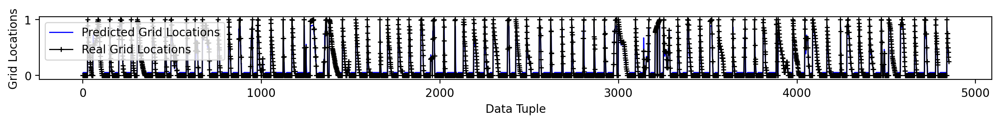

In [66]:
plt.figure(figsize=(15, 1), dpi=100)
plt.plot(pred,
         linewidth=1, 
         color='blue', 
         label='Predicted Grid Locations')
plt.plot(y_test,
         linewidth=1, 
         color='black',
         marker='+',
         markersize=4,
         label='Real Grid Locations')
# plt.savefig('denormalized_predictions')
plt.xlabel('Data Tuple')
plt.ylabel('Grid Locations')

plt.legend(loc='upper left')
# plt.savefig('grid_accuracy.png')
plt.show()

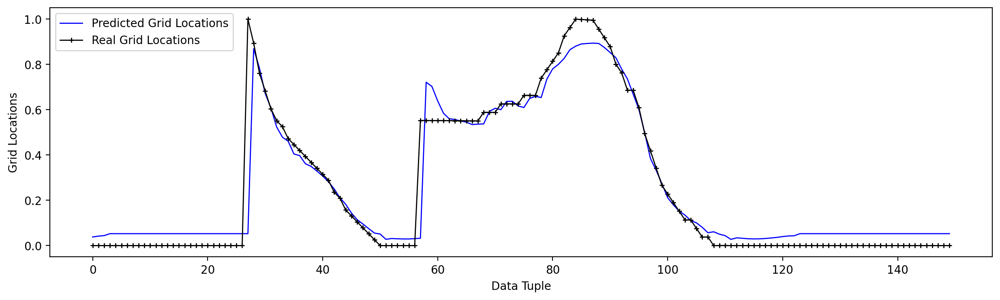

In [67]:
plt.figure(figsize=(15, 4), dpi=100)
plt.plot(pred[:150],
         linewidth=1, 
         color='blue', 
         label='Predicted Grid Locations')
plt.plot(y_test[:150],
         linewidth=1, 
         color='black',
         marker='+',
         markersize=4,
         label='Real Grid Locations')
# plt.savefig('denormalized_predictions')
plt.xlabel('Data Tuple')
plt.ylabel('Grid Locations')

plt.legend(loc='upper left')
# plt.savefig('grid_accuracy.png')
plt.show()

In [68]:
pred[0:60].flatten()

array([0.0380262 , 0.04182308, 0.04411478, 0.05271224, 0.05271224,
       0.05271224, 0.05271224, 0.05271224, 0.05271224, 0.05271224,
       0.05271224, 0.05271224, 0.05271224, 0.05271224, 0.05271224,
       0.05271224, 0.05271224, 0.05271224, 0.05271224, 0.05271224,
       0.05271224, 0.05271224, 0.05271224, 0.05271224, 0.05271224,
       0.05271224, 0.05271224, 0.05271224, 0.8697021 , 0.7848949 ,
       0.67205083, 0.6079004 , 0.5236413 , 0.47884616, 0.46082845,
       0.40464982, 0.39741245, 0.36146045, 0.34975368, 0.3290882 ,
       0.30743635, 0.28202176, 0.25059855, 0.21090369, 0.1825495 ,
       0.1438549 , 0.11429199, 0.09528527, 0.07510339, 0.05537514,
       0.05102387, 0.02764934, 0.03129528, 0.03009612, 0.02931824,
       0.02930347, 0.03074797, 0.03245163, 0.72160774, 0.702829  ],
      dtype=float32)

In [69]:
flat_pred = pred.flatten()

In [70]:
y_test[0:80]

array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 1.        , 0.89409499, 0.7623021 ,
       0.68335473, 0.60419341, 0.55156183, 0.52524604, 0.47261446,
       0.44629867, 0.42019683, 0.39388104, 0.36756525, 0.34124947,
       0.31514763, 0.28883184, 0.23620026, 0.20988447, 0.15746684,
       0.13115105, 0.10483526, 0.07851947, 0.05241763, 0.02610184,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.55253399, 0.55253399, 0.55222497,
       0.55222497, 0.55222497, 0.55191595, 0.55160692, 0.55160692,
       0.5512979 , 0.55098888, 0.55098888, 0.58868974, 0.58838072,
       0.58838072, 0.62608158, 0.62608158, 0.62608158, 0.62608

In [71]:
hurr_real = []
hurr_pred = []
temp_real = []
temp_pred = []
for x in range(len(y_test)):
#     print(y_test[x])
    if not y_test[x] == 0:
        temp_real += [y_test[x]]
#         print(len(temp_real))
        temp_pred += [flat_pred[x]]
#         print(len(temp_pred))
    else:
        hurr_real += [temp_real]
#             print(hurr_real)
        hurr_pred += [temp_pred]
#             print(hurr_pred)
#             print(' ')
#             plt.plot(hurr_real, hurr_pred)
        temp_real = []
        temp_pred = []
        

In [72]:
print(len(hurr_real))
print(len(hurr_pred))

lol_real = [x for x in hurr_real if bool(x)]
print(len(lol_real))
lol_pred = [x for x in hurr_pred if bool(x)]
print(len(lol_pred))

3132
3132
112
112


In [73]:
len(data[data['unique-key'] == 'NOTNAMED-1929-2'])

7

In [74]:
data.tail(10)

,WindSpeed,Pressure,unique-key,distance,direction,gridID
33057,0.434783,0.594937,NOTNAMED-1928-4,0.013386,0.521893,0.549296
33064,0.086957,1.000000,NOTNAMED-1928-4,0.618161,1.000000,0.861408
33066,0.000000,0.924051,NOTNAMED-1928-4,0.272938,0.580343,1.000000
33151,1.000000,0.000000,NOTNAMED-1929-2,0.000000,0.000000,0.172789
33152,0.875000,0.193548,NOTNAMED-1929-2,0.077604,1.000000,0.172789
33162,0.562500,0.387097,NOTNAMED-1929-2,0.445537,0.049159,0.000000
33163,0.562500,0.387097,NOTNAMED-1929-2,0.019433,0.551499,0.000000
33174,0.187500,0.822581,NOTNAMED-1929-2,1.000000,0.097627,0.997279
33175,0.062500,0.822581,NOTNAMED-1929-2,0.047113,0.058085,0.997279
33176,0.000000,1.000000,NOTNAMED-1929-2,0.171838,0.173712,1.000000


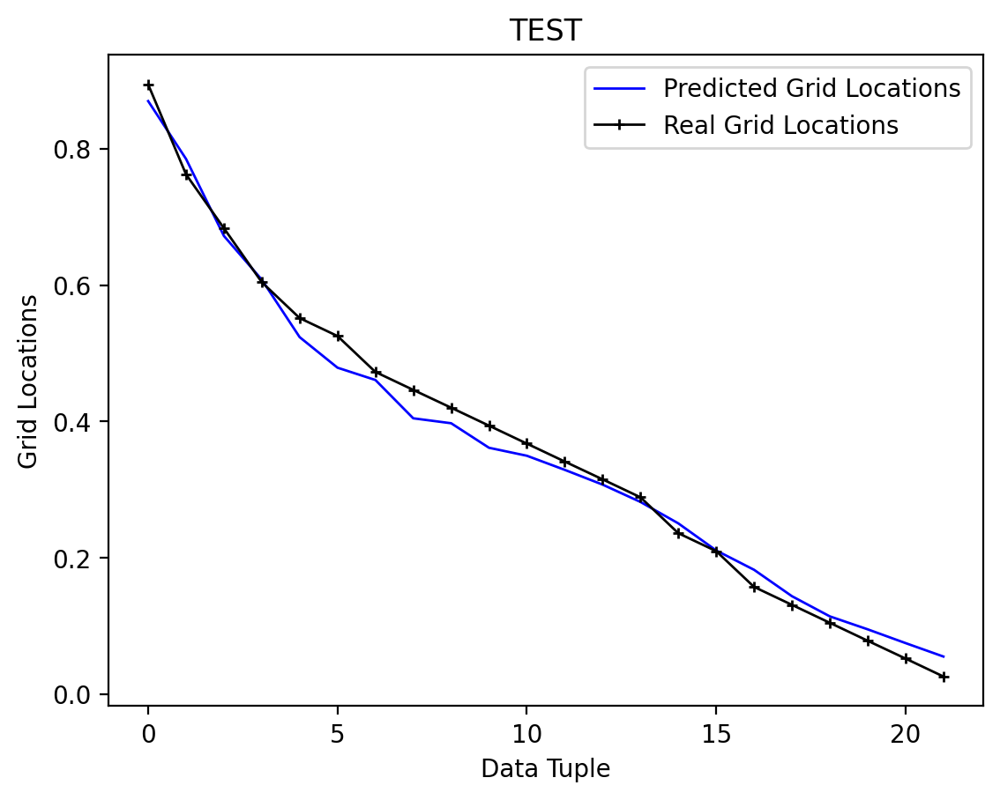

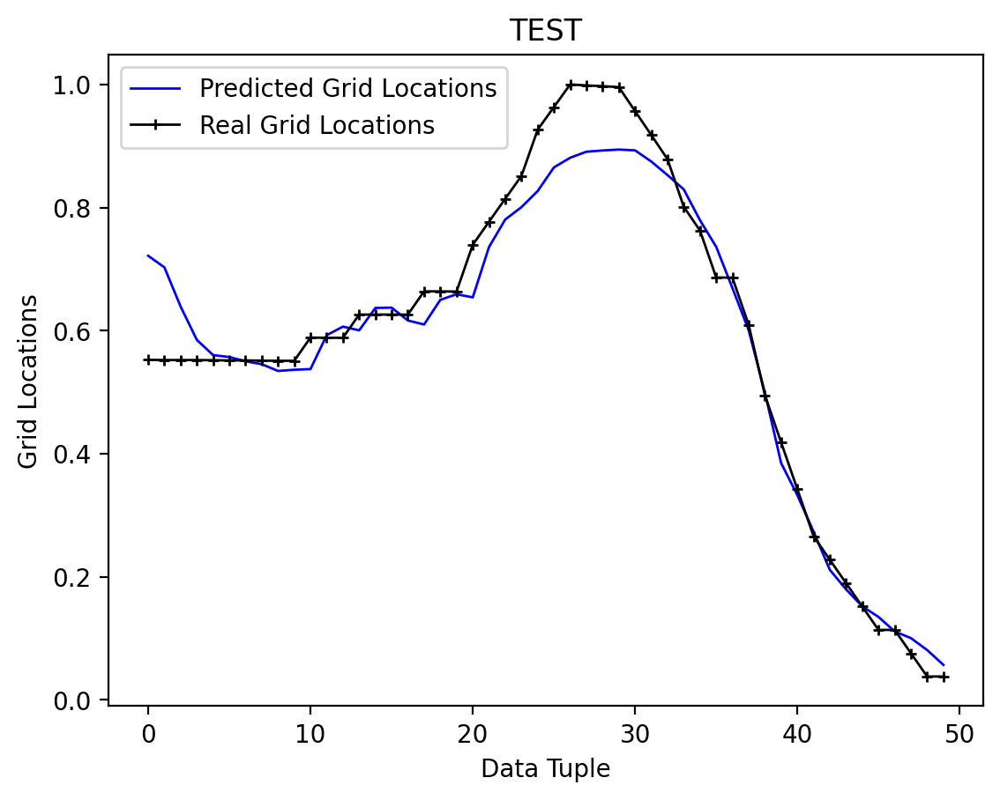

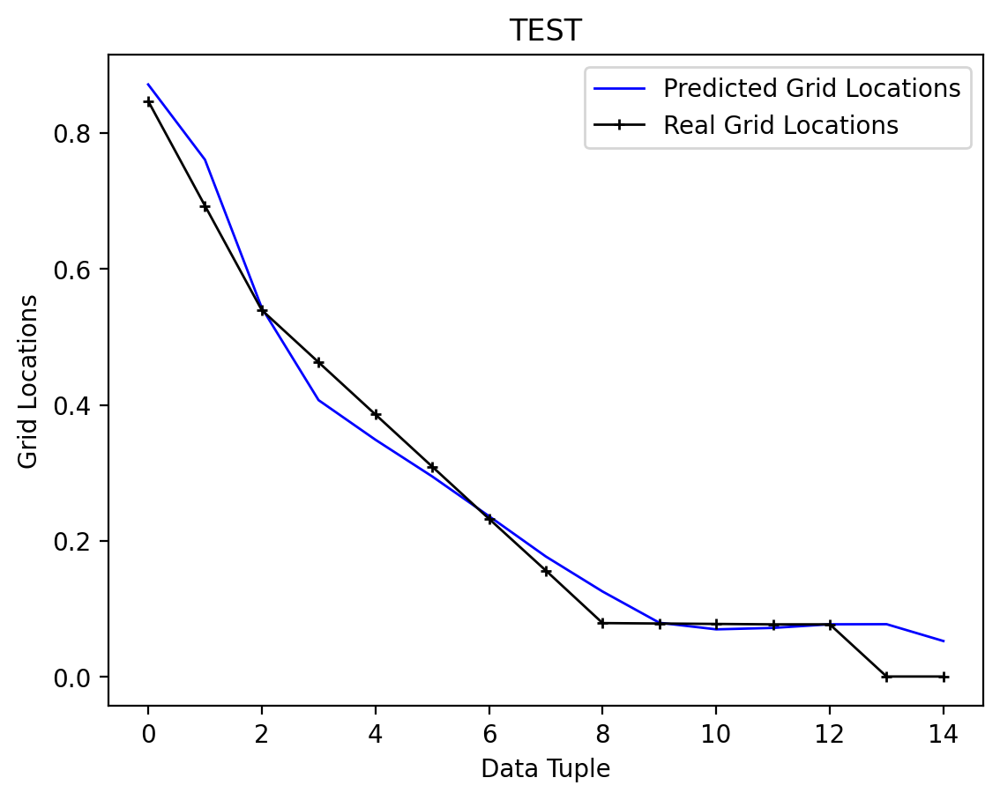

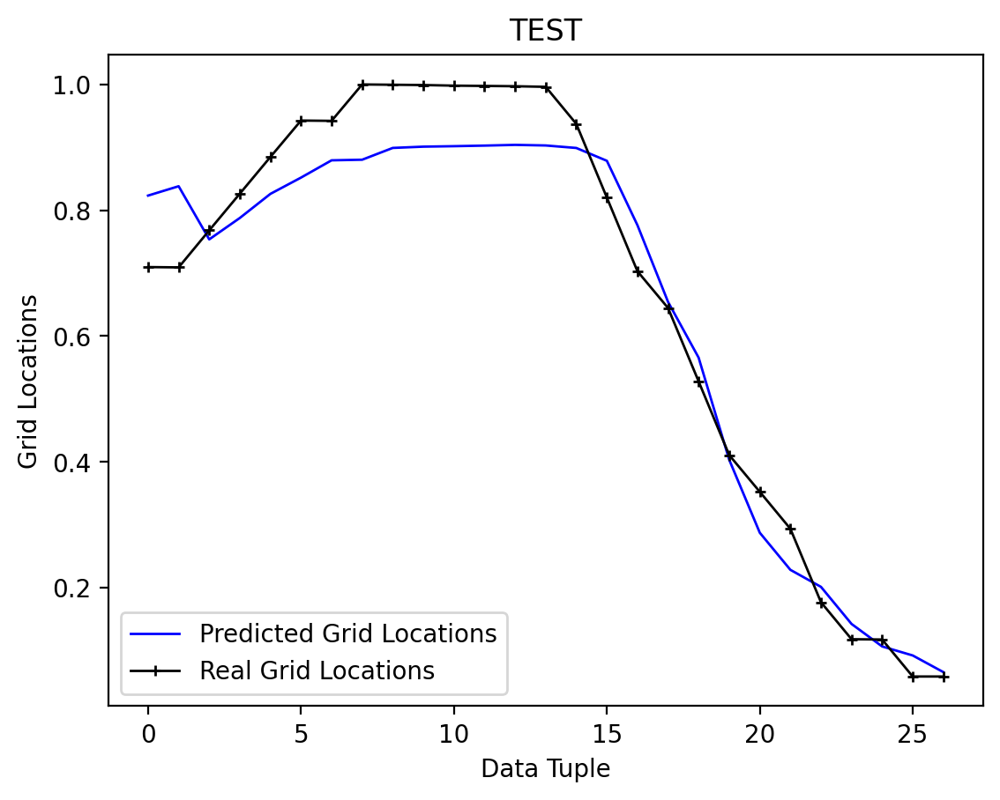

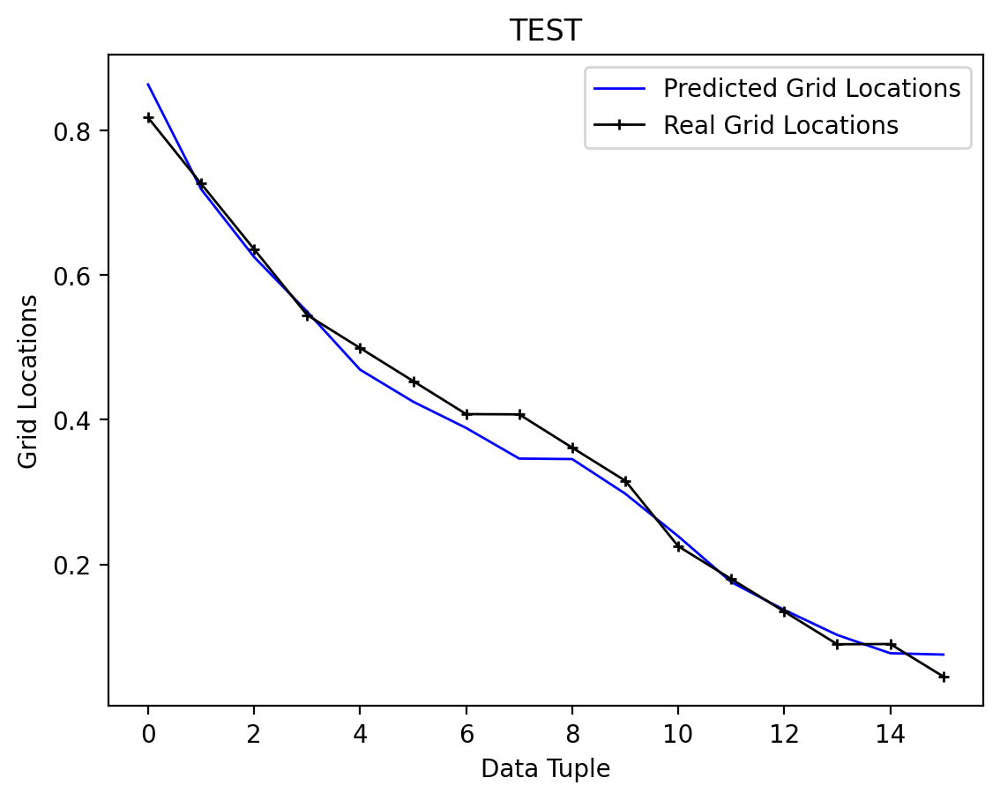

...

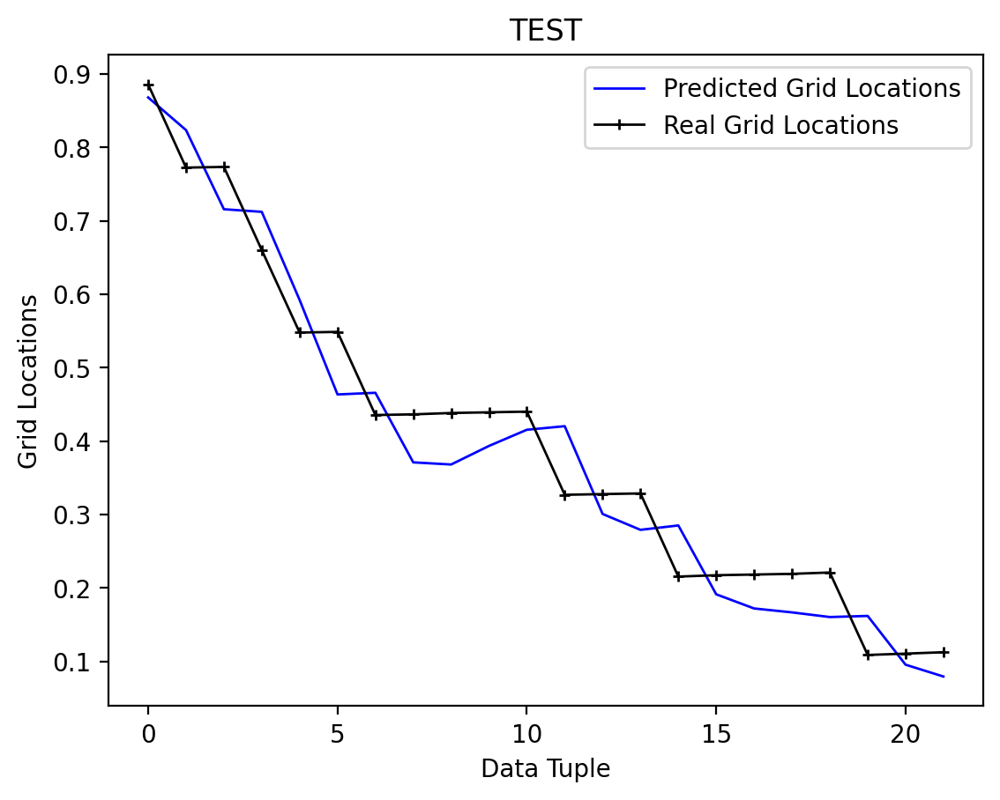

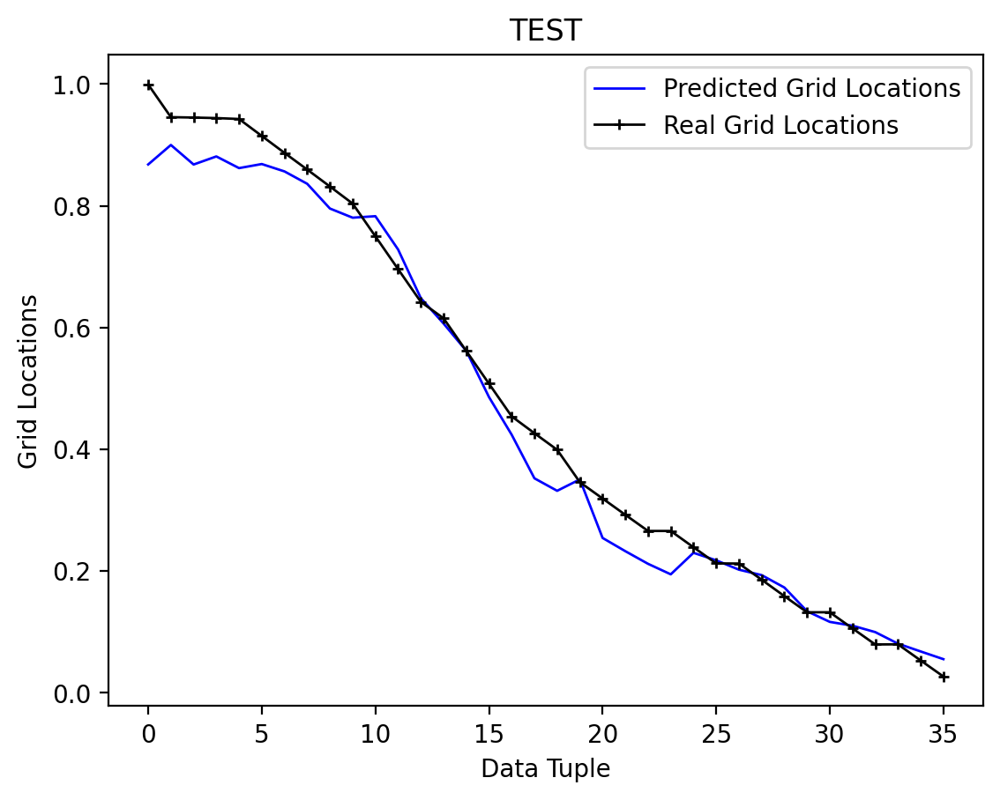

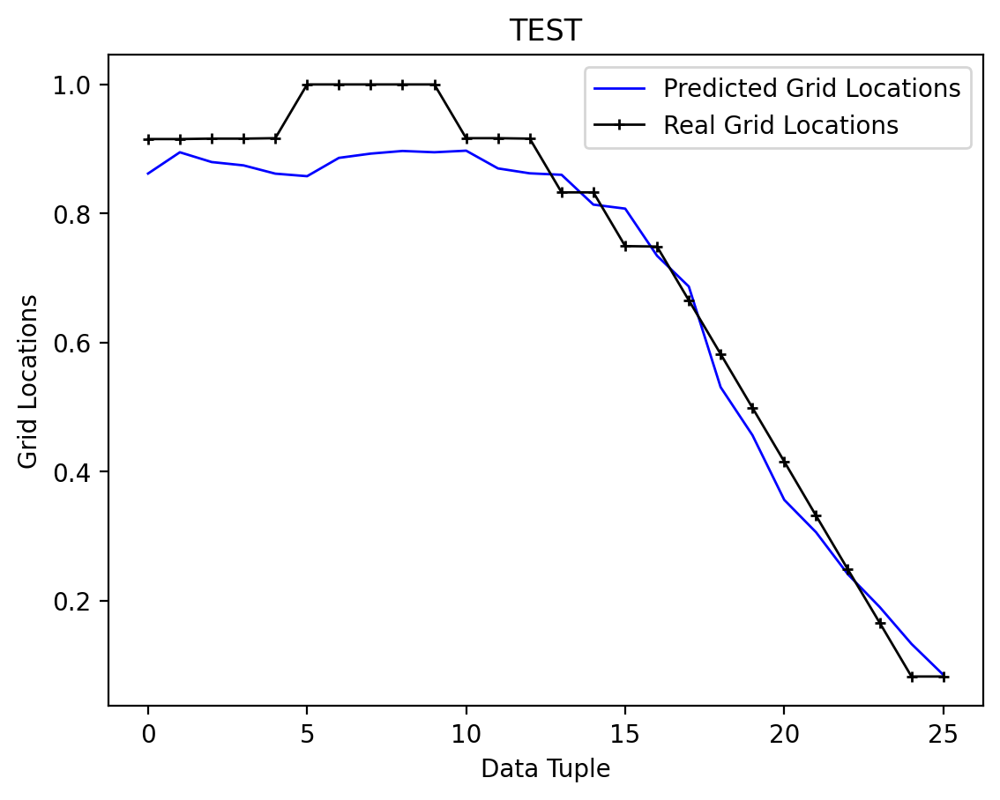

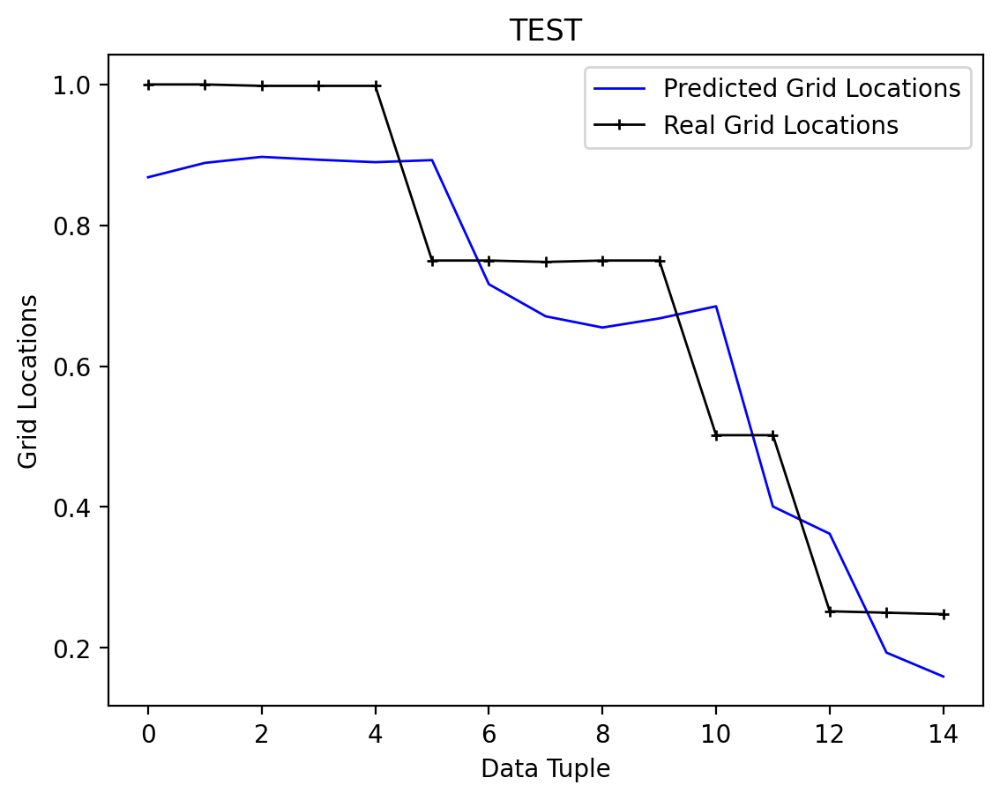

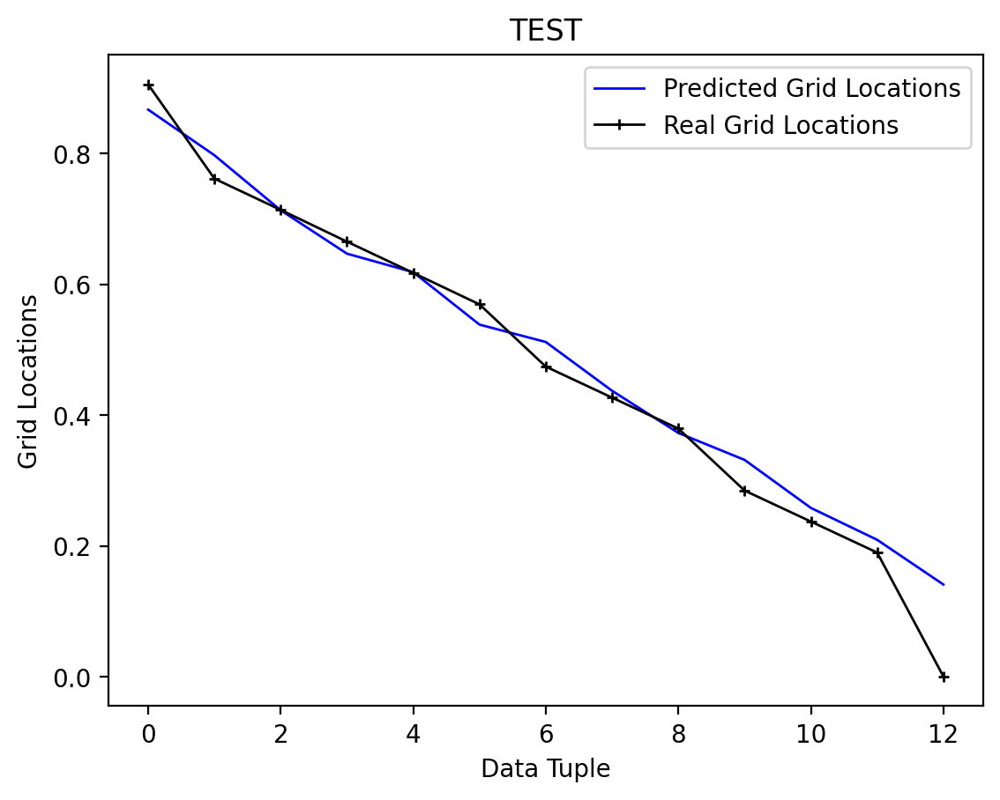

In [75]:
for x in range(len(lol_real)):
    if len(lol_real[x]) > 12:
        plt.plot(lol_pred[x][1:], linewidth=1, color='blue', label='Predicted Grid Locations')
#         plt.plot(lol_pred_temp[x][1:14], label='Training Grid Locations')
#         plt.plot(list(range(12, len(lol_pred_temp[x]))), lol_pred_temp[x][12:], label='Predicted Grid Locations')
        plt.plot(lol_real[x][1:], linewidth=1, color='black', marker='+', markersize=4, label='Real Grid Locations')
        plt.title('TEST')
        plt.xlabel('Data Tuple')
        plt.ylabel('Grid Locations')
        plt.legend()
        plt.show()

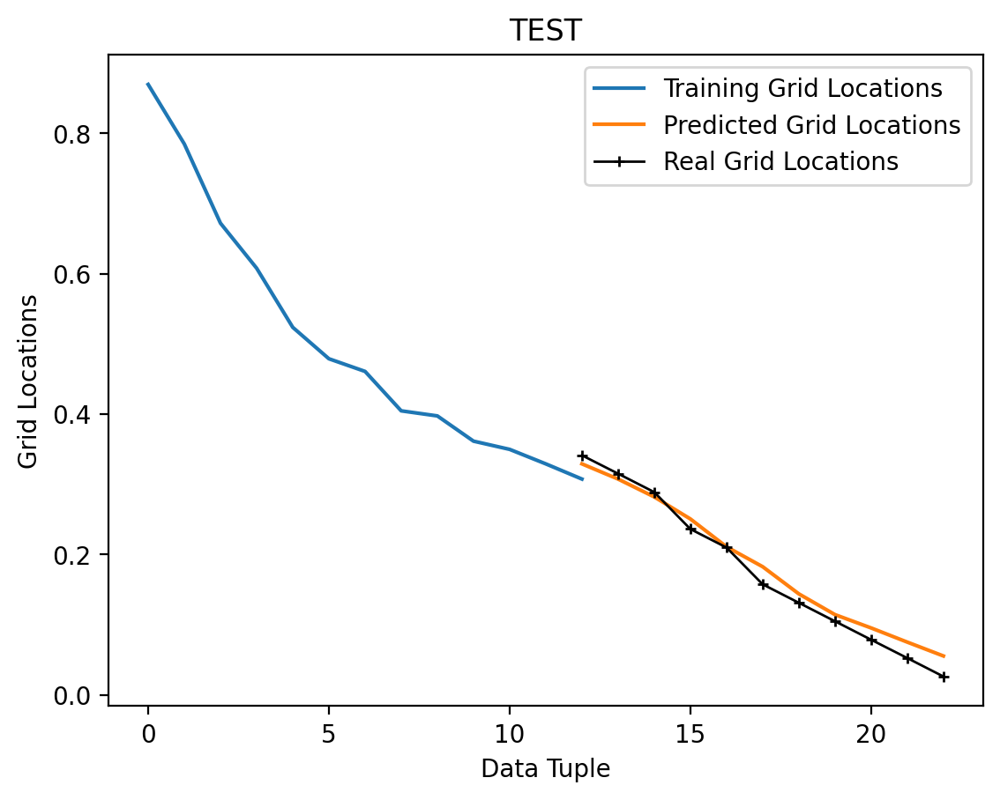

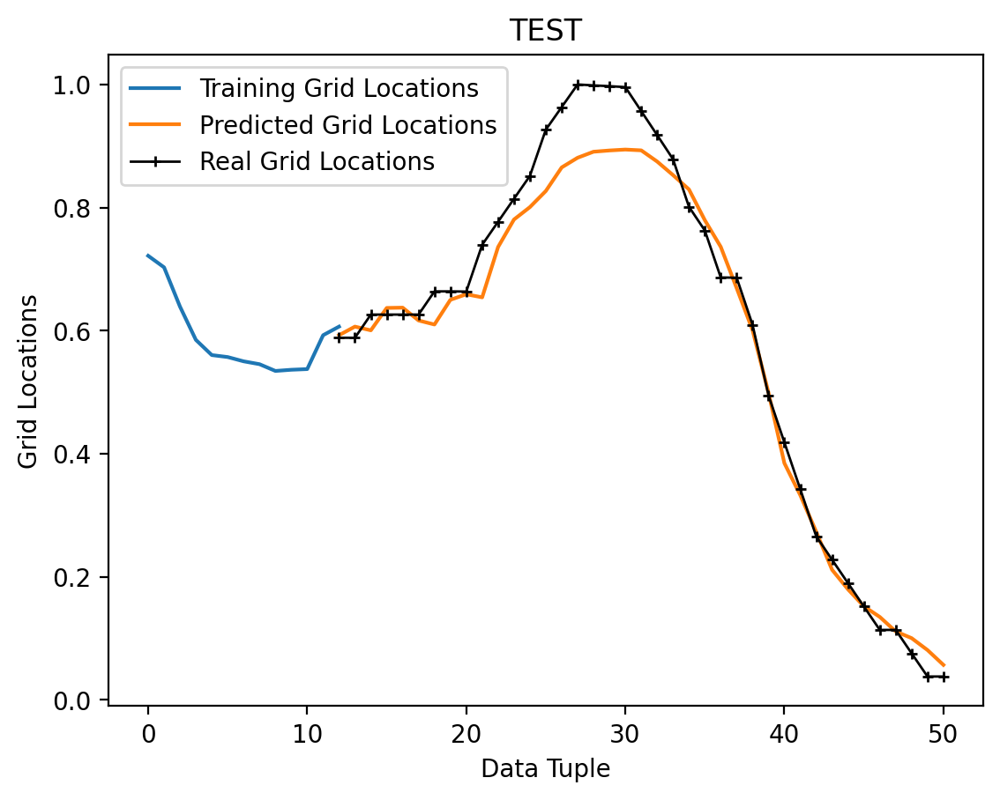

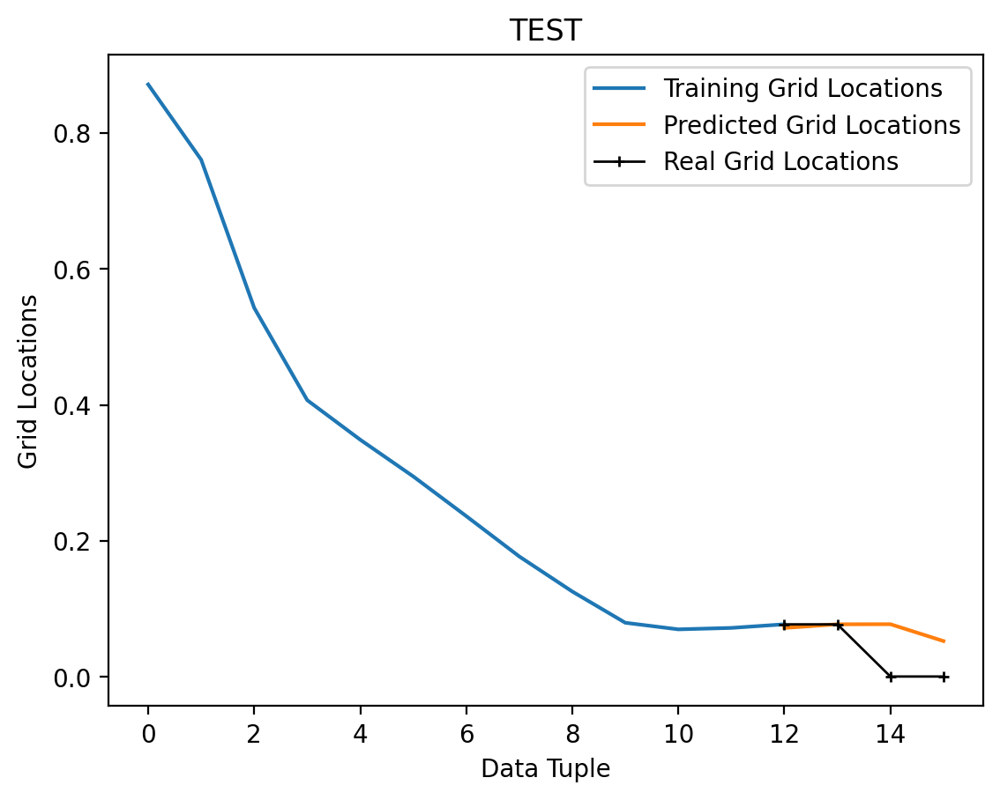

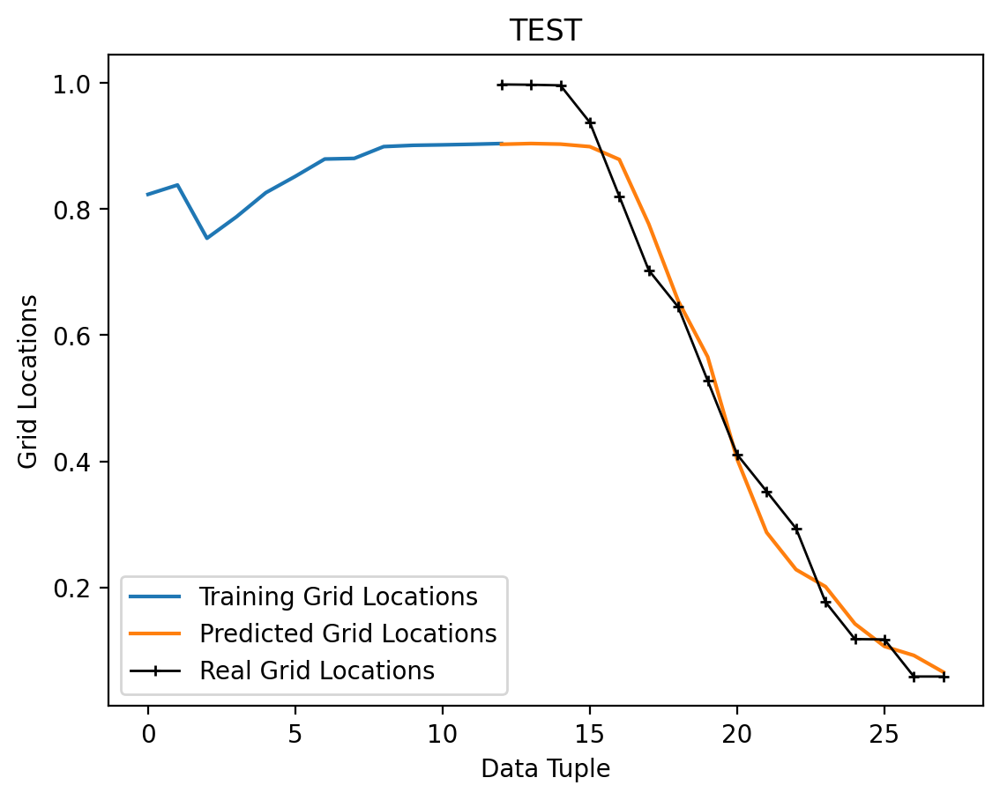

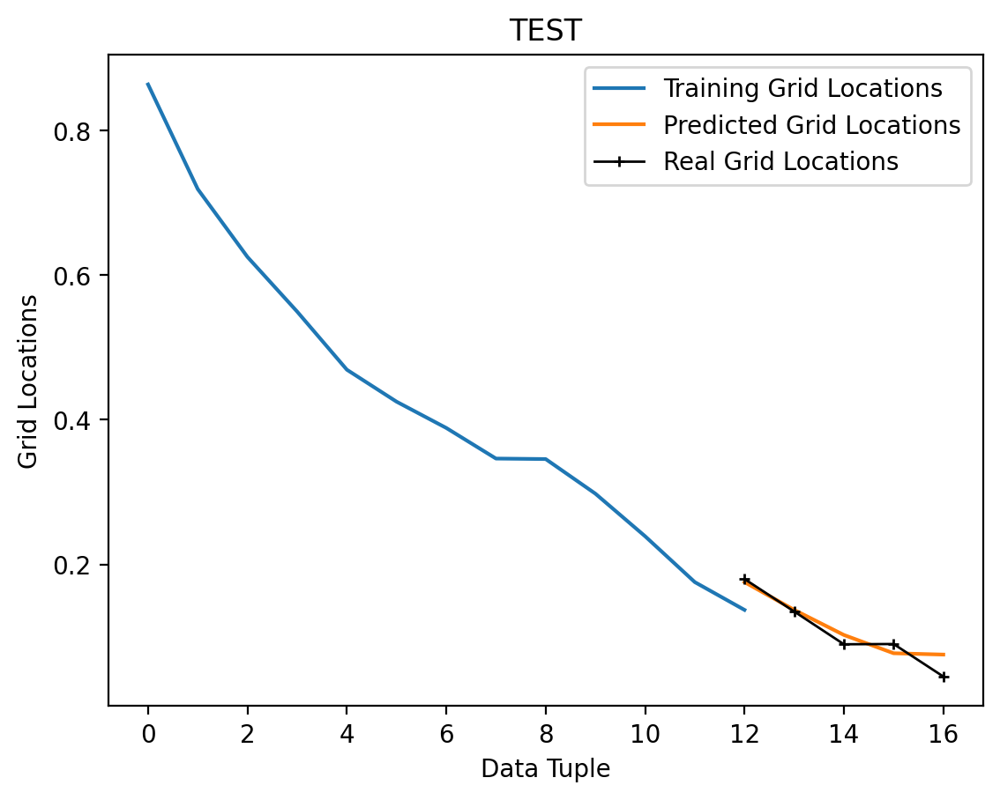

...

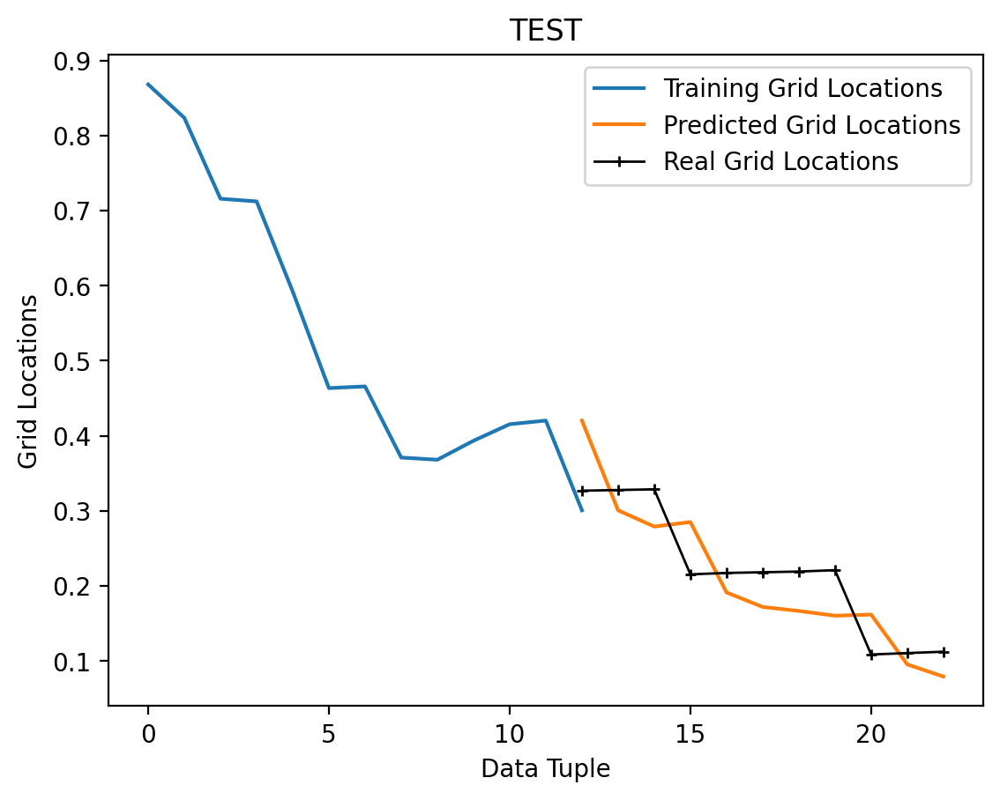

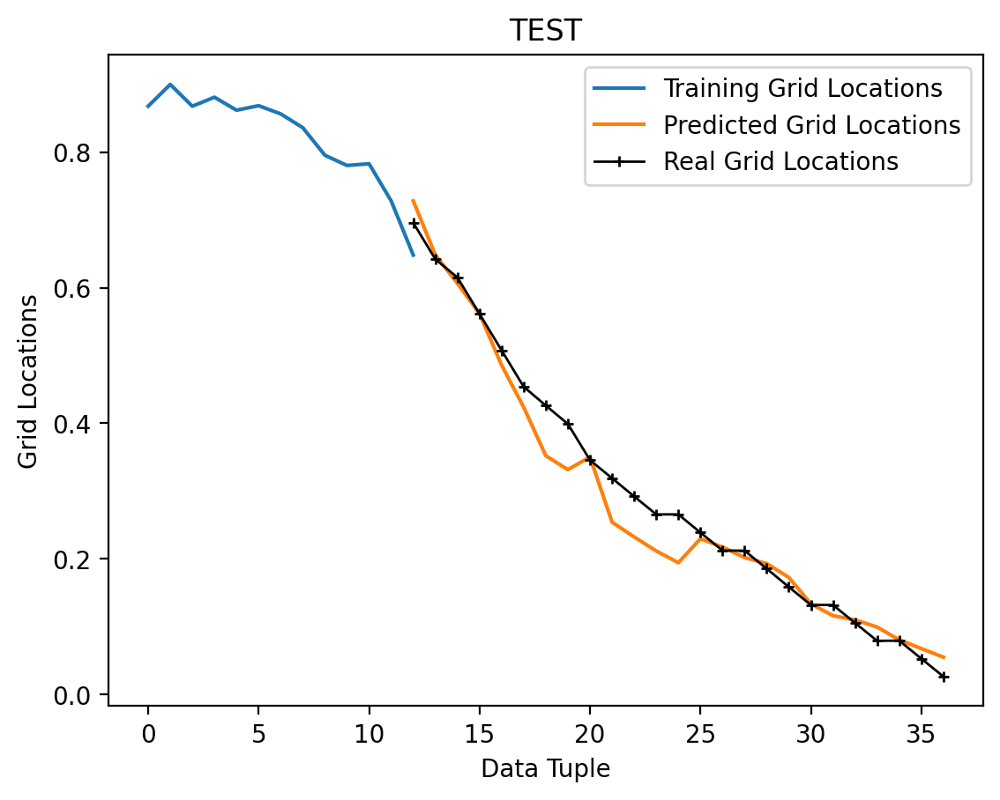

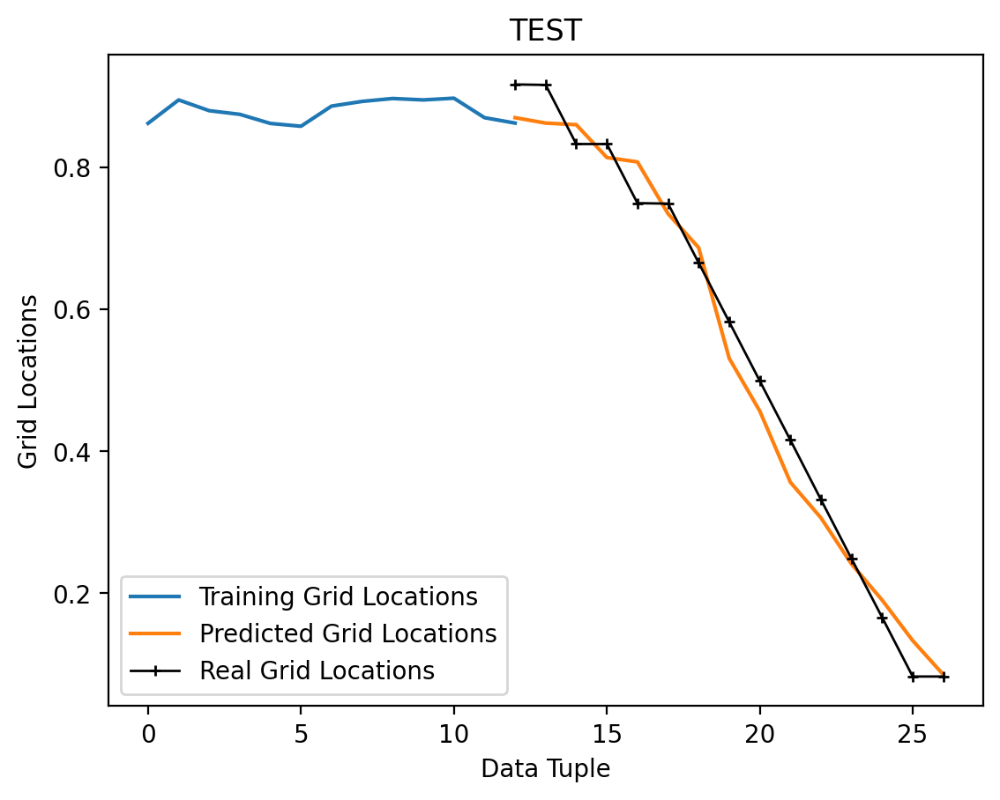

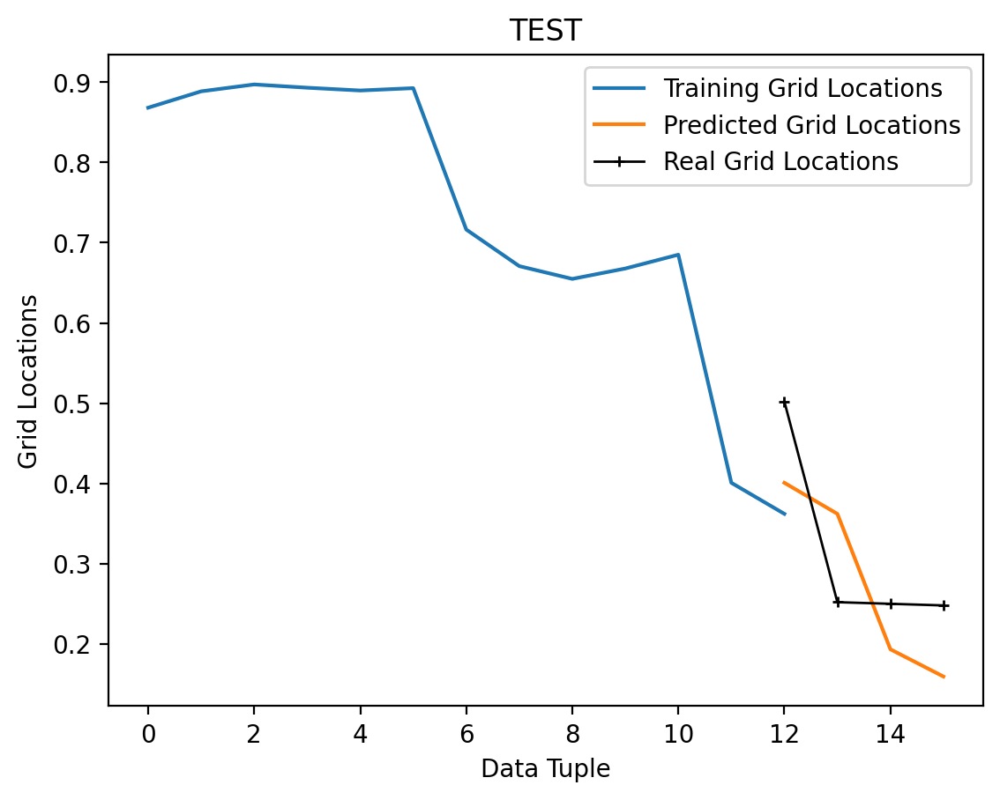

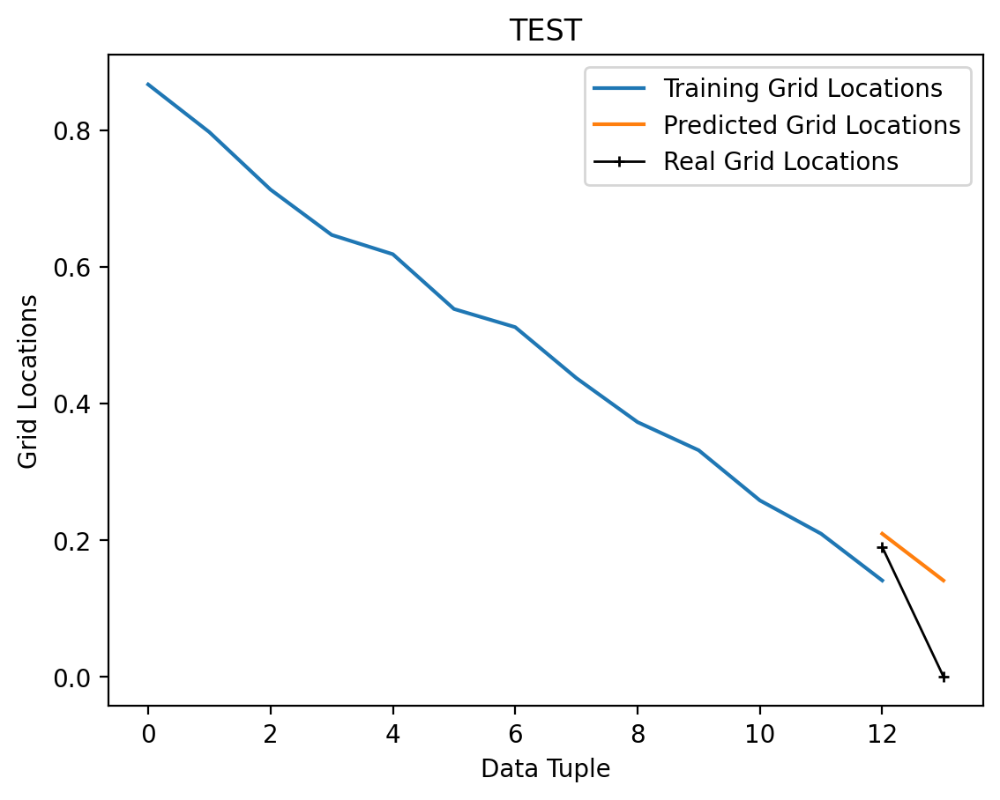

In [76]:
for x in range(len(lol_real)):
    if len(lol_real[x]) > 12:
#         plt.plot(lol_pred[x][1:], linewidth=1, color='blue', label='Predicted Grid Locations')
        plt.plot(lol_pred[x][1:14], label='Training Grid Locations')
        plt.plot(list(range(12, len(lol_pred[x]))), lol_pred[x][12:], label='Predicted Grid Locations')
        plt.plot(list(range(12, len(lol_pred[x]))), lol_real[x][12:], linewidth=1, color='black', marker='+', markersize=4, label='Real Grid Locations')
        plt.title('TEST')
        plt.xlabel('Data Tuple')
        plt.ylabel('Grid Locations')
        plt.legend()
        plt.show()

In [77]:
model.summary()
model.get_config()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, None, 5)           220       
                                                                 
 dropout (Dropout)           (None, None, 5)           0         
                                                                 
 lstm_1 (LSTM)               (None, None, 5)           220       
                                                                 
 dropout_1 (Dropout)         (None, None, 5)           0         
                                                                 
 lstm_2 (LSTM)               (None, None, 5)           220       
                                                                 
 dropout_2 (Dropout)         (None, None, 5)           0         
                                                                 
 lstm_3 (LSTM)               (None, 1)                 2

{'name': 'sequential',
 'layers': [{'class_name': 'InputLayer',
   'config': {'batch_input_shape': (None, None, 5),
    'dtype': 'float32',
    'sparse': False,
    'ragged': False,
    'name': 'lstm_input'}},
  {'class_name': 'LSTM',
   'config': {'name': 'lstm',
    'trainable': True,
    'batch_input_shape': (None, None, 5),
    'dtype': 'float32',
    'return_sequences': True,
    'return_state': False,
    'go_backwards': False,
    'stateful': False,
    'unroll': False,
    'time_major': False,
    'units': 5,
    'activation': 'tanh',
    'recurrent_activation': 'sigmoid',
    'use_bias': True,
    'kernel_initializer': {'class_name': 'GlorotUniform',
     'config': {'seed': None}},
    'recurrent_initializer': {'class_name': 'Orthogonal',
     'config': {'gain': 1.0, 'seed': None}},
    'bias_initializer': {'class_name': 'Zeros', 'config': {}},
    'unit_forget_bias': True,
    'kernel_regularizer': None,
    'recurrent_regularizer': None,
    'bias_regularizer': None,
    'ac